In [1]:
import sys
import os

# Add the parent directory to the Python path
sys.path.append(os.path.abspath('..'))

import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
import matplotlib.patches as patches
import torch
import copy
import sys
sys.path.append("/Users/LOCCO_Louise/Documents/Git/code_amaury")
from simu_PSF_polarMFM import *
from extract_experimental_psf import *
from tqdm import tqdm
import time

In [2]:
if torch.cuda.is_available():
    device = torch.device('cuda')
    print("Using GPU")
else:   
    device = torch.device('cpu')
    print("Using CPU")

Using GPU


In [3]:
d = np.array([1.1643099, 1.4462458, 1.7931267])
d = np.array([np.mean(d)-0.350, np.mean(d), np.mean(d)+0.350])
QE = 0.92
EM = 250
sensitivity = 15.4

In [4]:
Nframe=15

In [5]:
raw = np.zeros((Nframe,6,214,129))

In [6]:
path_info = '\\\\NAS_LOCCO\\Amaury\\DATA\\PolMFM_SilicaBeads_SLB_NR\\image_Pos0_2.ome_results_fr1to8095_method=Propagation matrix_box-method=Fixed_invertRotationPolarizer_corr.csv'

In [7]:
def extract_frames(frame_0, N_frame):
    error_indices = []
    for i in range(N_frame):
        number = str(frame_0 + i).zfill(4)
        print(number)
        path_data = '\\\\NAS_LOCCO\\Amaury\\DATA\\PolMFM_SilicaBeads_SLB_NR\\2024-01-11_SilicaBeads_Lipids_NR\\001_SM_560nm_EM250_25ms\\SilicaBead\\images\\RAW_DATA\\image_Pos0_2_reco\\image_Pos0_2_'+number+'.tif'
        raw_ = extract_raw(path_data)
        if raw_ is None:
            error_indices.append(i)
            continue
        else:
            raw[i] = raw_
        del(raw_)
    return raw, error_indices

def extract_positions(frame_0, N_frame, error_indices):
    index_frame = []
    x, y, z, rho, delta = [], [], [], [], []
    ind = 0
    for i in range(N_frame):
        if i not in error_indices:
            x__, y__, z__, rho__, delta__ = position_from_data(data, frame_0+i)
            x = np.concatenate((x, x__))
            y = np.concatenate((y, y__))
            z = np.concatenate((z, z__))
            rho = np.concatenate((rho, rho__))
            delta = np.concatenate((delta, delta__))
            for k in range(len(x__)):
                index_frame.append(ind)
        ind+=1
    index_frame=np.array(index_frame)
    return x, y, z, rho, delta, index_frame

def limit(x, lim, slope, upper=True):
    '''
    if upper:
       return torch.sum(torch.tensor(1/(1+torch.exp(-slope*(x-lim))), requires_grad=True, device=device))
    else:
        return torch.sum(torch.tensor(1/(1+torch.exp(slope*(x-lim))), requires_grad=True, device=device))
    '''
    if upper:
        return torch.sum(torch.exp((x-lim)*slope))
    else:
        return torch.sum(torch.exp(-1*(x-lim)*slope))
    
def loss_pos(xp, yp, zp, rho, eta, delta, N_photons, data, second_plane, background, sigma, dim_simu):
    u, v, M_ = compute_M(xp=xp, yp=yp, zp=zp, d=d_, x=xx, y=yy, th1=th1, phi=phi, Ex0=Ex0, Ex1=Ex1, Ex2=Ex2
                    , Ey0=Ey0, Ey1=Ey1, Ey2=Ey2, r=r, r_cut=r_cut, k=k_, f_o=f_o, phase_maskx=phase_mask, phase_masky=phase_mask, zernike_base=zernike_base, zernike_coefs_x=zernike_coefs_x, zernike_coefs_y=zernike_coefs_x,
                        second_plane=second_plane, polar_projections=polar_projections, N=N,
                    l_pixel=l_pixel, NA=NA, mag=mag, lambd=lambd, f_tube=f_tube, MAG=MAG, device=device, polar_offset=0., polar_offset2=0.)
    dim_data = 6
    h = PSF(rho=rho, eta=eta, delta=delta, M=M_, N_photons=N_photons)[:,:,:,dim_simu-dim_data:dim_simu+dim_data+1,dim_simu-dim_data:dim_simu+dim_data+1]
    loss = torch.sum(torch.add(h, -(data+sigma**2)*torch.log(h+background+sigma**2)))
    #loss = torch.sum(torch.pow(torch.sum(torch.add(h, -data), dim=(2,)), 2)) 
    x_bound = limit(xp, 5*0.12, 100, upper=True) + limit(xp, -5*0.12, 100, upper=False)
    y_bound = limit(yp, 5*0.12, 100, upper=True) + limit(yp, -5*0.12, 100, upper=False)
    z_bound = limit(zp, 5., 100, upper=True) + limit(zp, 0, 100, upper=False)
    N_bound = torch.sum((N_photons - (torch.sum(data, dim=(1,2,3,4)) - background*len(data[0].flatten())) )**2)
    return loss +x_bound+y_bound+z_bound+N_bound

def loss_angle(M_, rho, eta, delta, N_photons, data, background, sigma, dim_simu):
    dim_data = 6
    h = PSF(rho=rho, eta=eta, delta=delta, M=M_, N_photons=N_photons)[:,:,:,dim_simu-dim_data:dim_simu+dim_data+1,dim_simu-dim_data:dim_simu+dim_data+1]

    loss = torch.sum(torch.add(h, -(data+sigma**2)*torch.log(h+background+sigma**2)))
    #loss = torch.sum(torch.pow(torch.sum(torch.add(h, -data), dim=(2,)), 2)) 
    delta_bound = limit(delta, 180, 100, upper=True) + limit(delta, 1, 100, upper=False)
    N_bound = torch.sum((N_photons - (torch.sum(data, dim=(1,2,3,4)) - background*len(data[0].flatten())) )**2)
    return loss + 1000.*(delta_bound) + N_bound #+ 100000*torch.sum(h**2)

def loss_angle_with_M(polar_proj, polar_proj2, rho, eta, delta, N_photons, x_fine, y_fine, z_fine, data, background, sigma, dim_simu):
    dim_data = 6
    u, v, M_ = compute_M(xp=x_fine, yp=y_fine, zp=z_fine, d=d_, x=xx, y=yy, th1=th1, phi=phi, Ex0=Ex0, Ex1=Ex1, Ex2=Ex2
                    , Ey0=Ey0, Ey1=Ey1, Ey2=Ey2, r=r, r_cut=r_cut, k=k_, f_o=f_o, phase_masky=phase_mask, phase_maskx=phase_mask, zernike_base=zernike_base, zernike_coefs_x=zernike_coefs_x, zernike_coefs_y=zernike_coefs_x,
                        second_plane=second_plane, polar_projections=polar_projections, N=N,
                    l_pixel=l_pixel, NA=NA, mag=mag, lambd=lambd, f_tube=f_tube, MAG=MAG, device=device, polar_offset=polar_proj, polar_offset2=polar_proj2)
    h = PSF(rho=rho, eta=eta, delta=delta, M=M_, N_photons=N_photons)[:,:,:,dim_simu-dim_data:dim_simu+dim_data+1,dim_simu-dim_data:dim_simu+dim_data+1]
    
    loss = torch.sum(torch.add(h, -(data+sigma**2)*torch.log(h+background+sigma**2)))
    #loss = torch.sum(torch.pow(torch.sum(torch.add(h, -data), dim=(2,)), 2)) 
    delta_bound = limit(delta, 180, 100, upper=True) + limit(delta, 1, 100, upper=False)
    N_bound = torch.sum((N_photons - (torch.sum(data, dim=(1,2,3,4)) - background*len(data[0].flatten())) )**2)
    return loss + 1000.*(delta_bound) + N_bound #+ 100000*torch.sum(h**2)

def score_eval(M_, rho, eta, delta, N_photons, data, background, sigma, dim_simu):
    dim_data = 6
    h = PSF(rho=rho, eta=eta, delta=delta, M=M_, N_photons=N_photons)[:,:,:,dim_simu-dim_data:dim_simu+dim_data+1,dim_simu-dim_data:dim_simu+dim_data+1]
    score = torch.sum(torch.add(h, -(data+sigma**2)*torch.log(h+background+sigma**2)), dim=(1,2,3,4))
    return score.numpy() 

In [8]:
data = pos_from_csv(path_info)

In [9]:
N_batch = 350

In [10]:
batch_offset = 0

In [11]:
torch.cuda.empty_cache()
torch.cuda.ipc_collect()

0001
0002
0003
0004
0005
0006
0007
0008
0009
0010
0011
0012
0013
0014
0015


C:\Users\Amaury\AppData\Local\Temp\ipykernel_38544\2791009917.py:55: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:281.)
  noisy_psf = torch.tensor([single_psf[k] for k in range(len(x))], device=device)
C:\Users\Amaury\anaconda3\envs\torch_new\Lib\site-packages\torch\functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\TensorShape.cpp:3596.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100%|██████████| 100/100 [00:45<00:00,  2.18it/s]


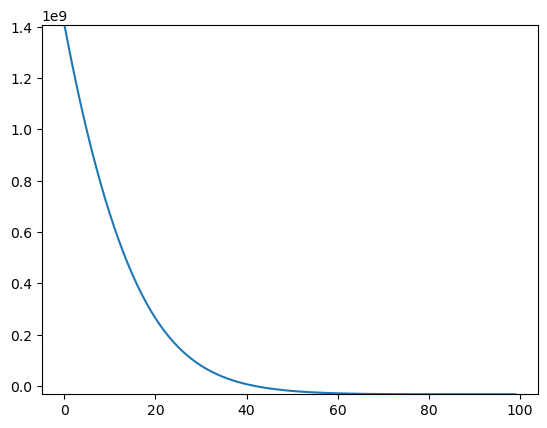

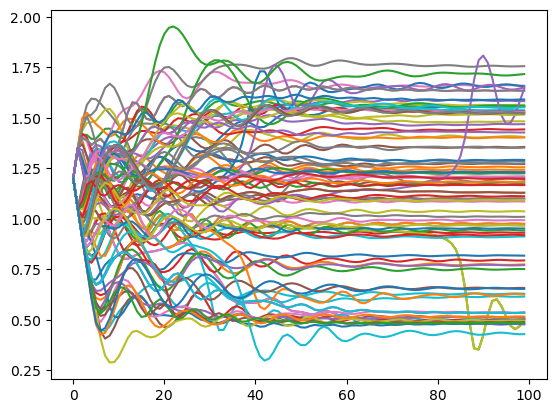

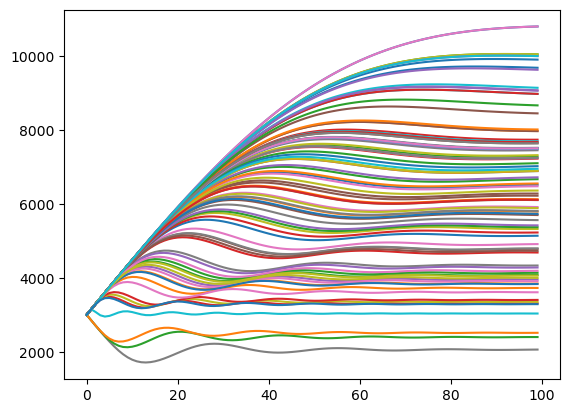

NPSF =  91


100%|██████████| 220/220 [03:11<00:00,  1.15it/s]


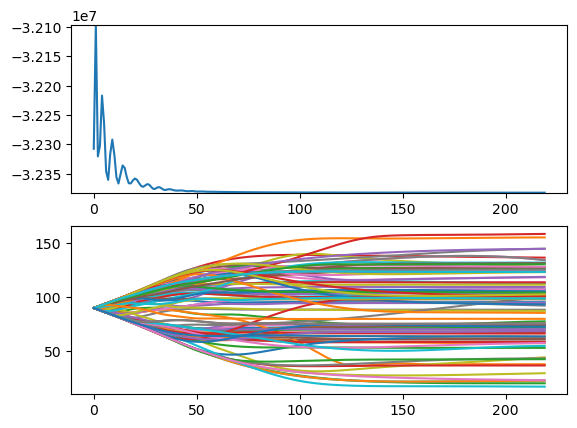

0016
0017
0018
0019
0020
0021
0022
0023
0024
0025
0026
0027
0028
0029
0030


100%|██████████| 100/100 [00:33<00:00,  3.02it/s]


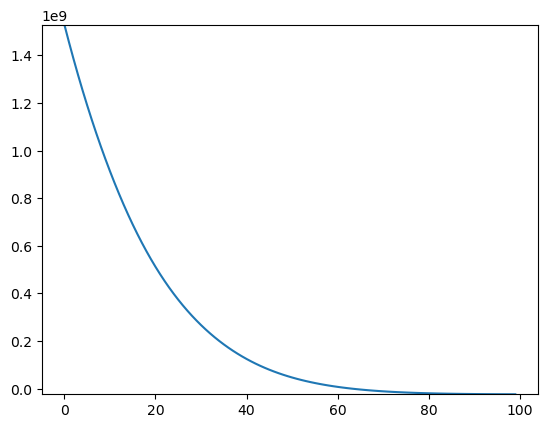

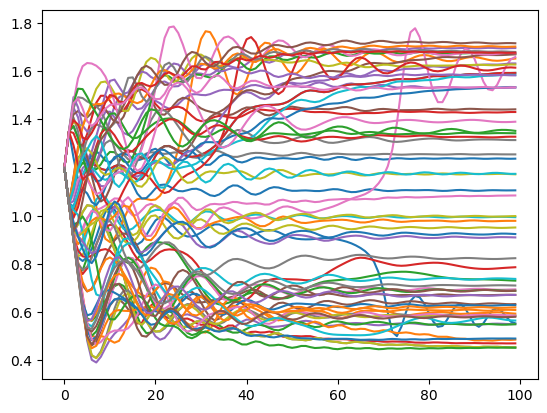

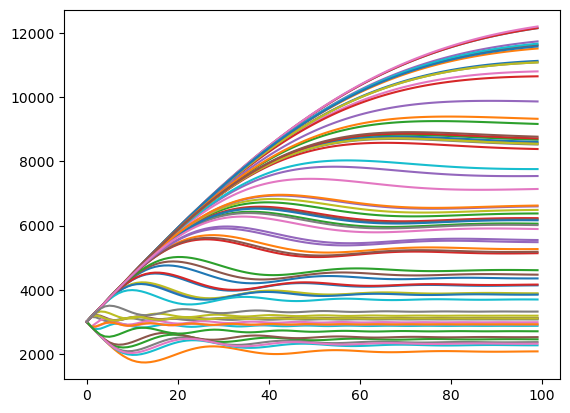

NPSF =  68


100%|██████████| 220/220 [02:41<00:00,  1.36it/s]


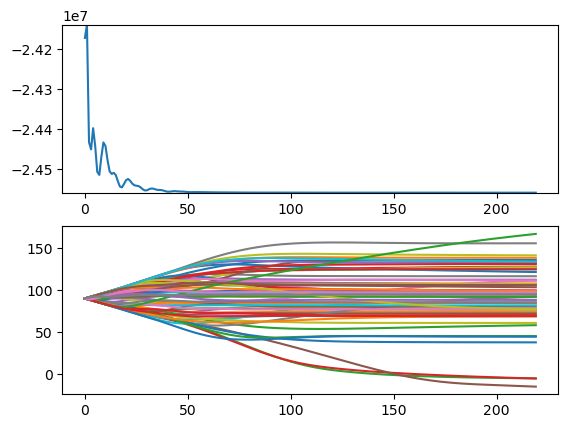

0031
0032
0033
0034
0035
0036
0037
0038
0039
0040
0041
0042
0043
0044
0045


100%|██████████| 100/100 [00:45<00:00,  2.18it/s]


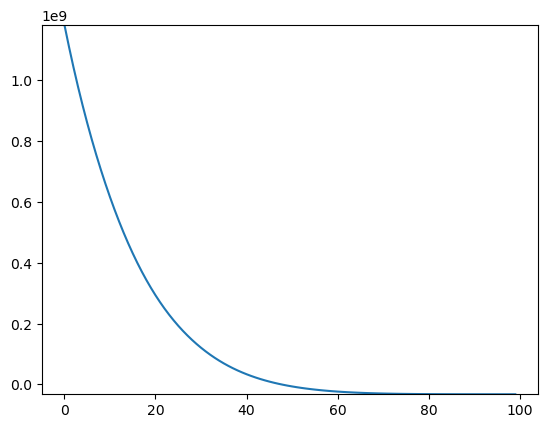

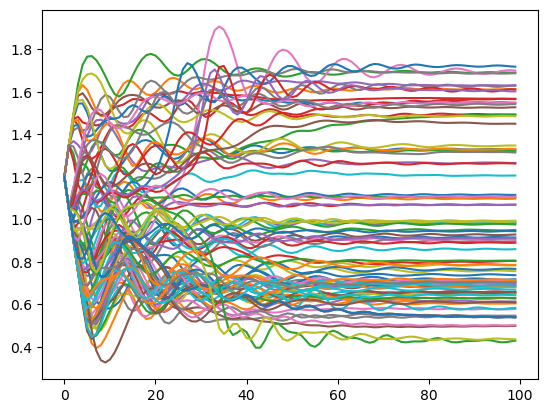

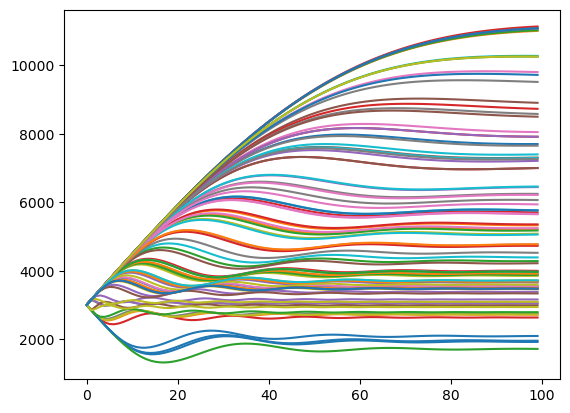

NPSF =  91


100%|██████████| 220/220 [03:10<00:00,  1.15it/s]


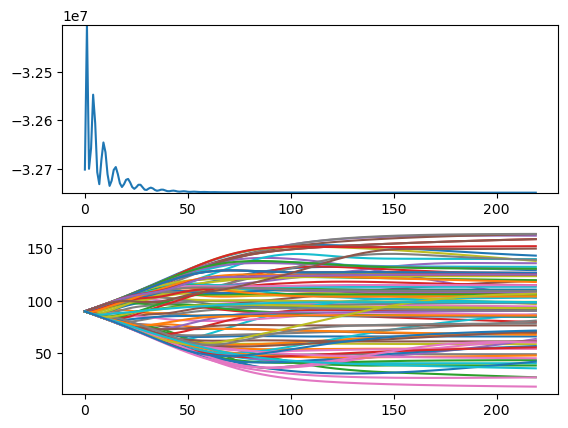

0046
0047
0048
0049
0050
0051
0052
0053
0054
0055
0056
0057
0058
0059
0060


100%|██████████| 100/100 [04:21<00:00,  2.61s/it]


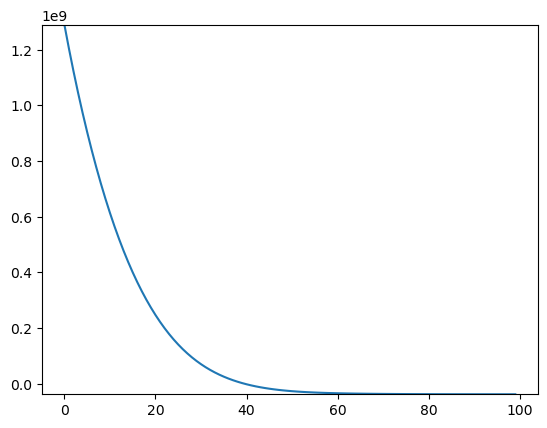

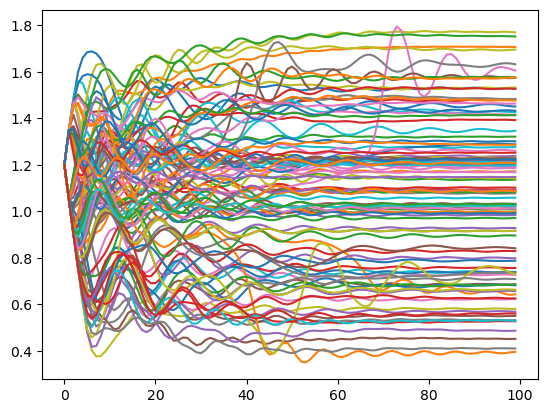

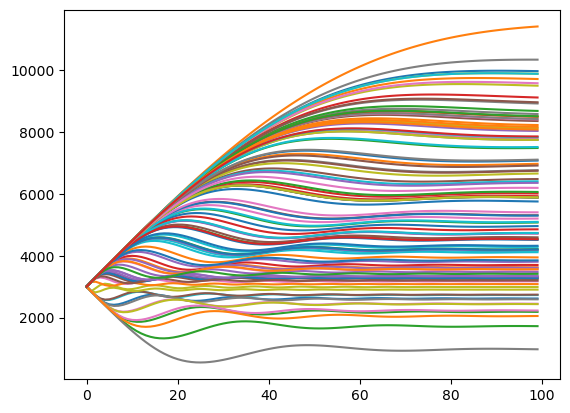

NPSF =  104


100%|██████████| 220/220 [20:21<00:00,  5.55s/it]


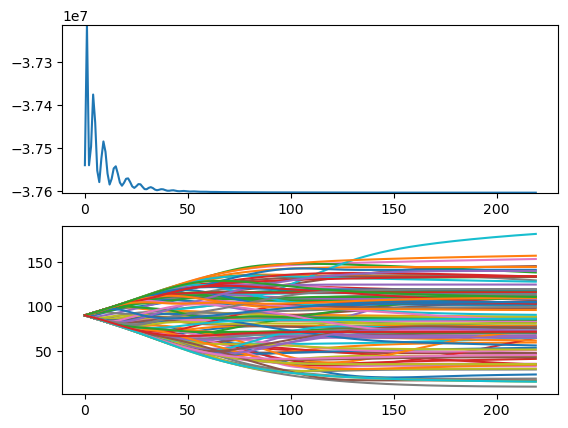

0061
0062
0063
0064
0065
0066
0067
0068
0069
0070
0071
0072
0073
0074
0075


100%|██████████| 100/100 [00:43<00:00,  2.30it/s]


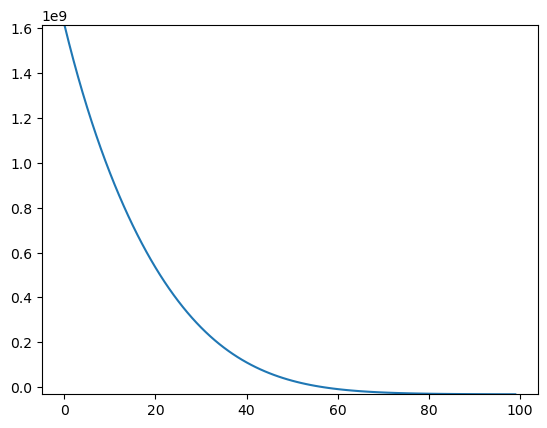

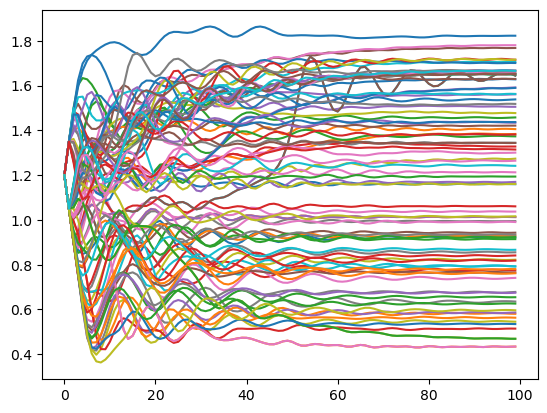

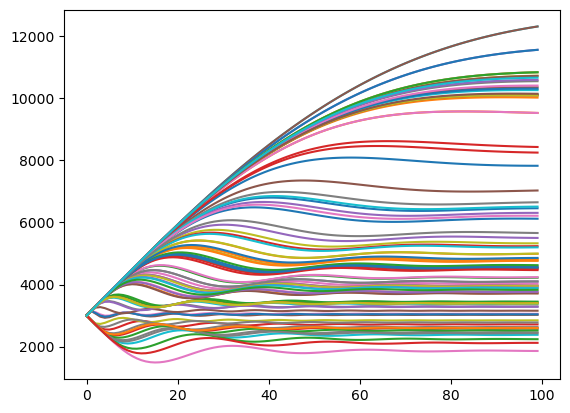

NPSF =  90


100%|██████████| 220/220 [03:02<00:00,  1.21it/s]


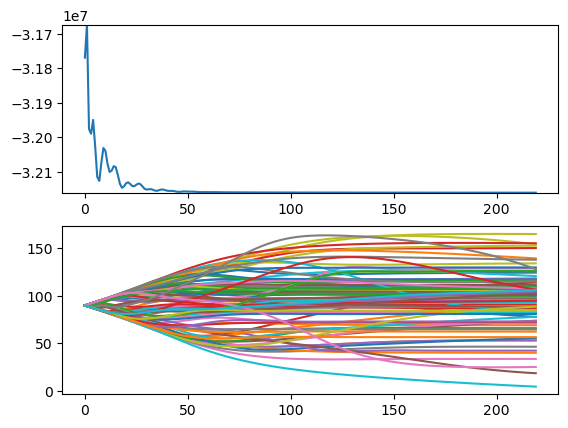

0076
0077
0078
0079
0080
0081
0082
0083
0084
0085
0086
0087
0088
0089
0090


100%|██████████| 100/100 [09:47<00:00,  5.87s/it]


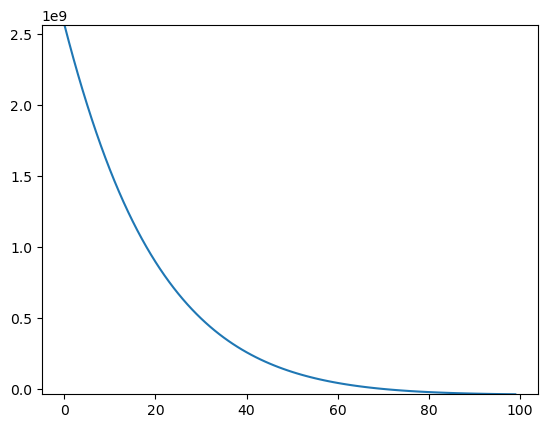

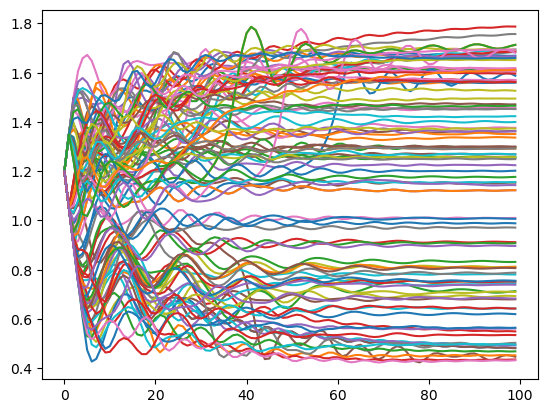

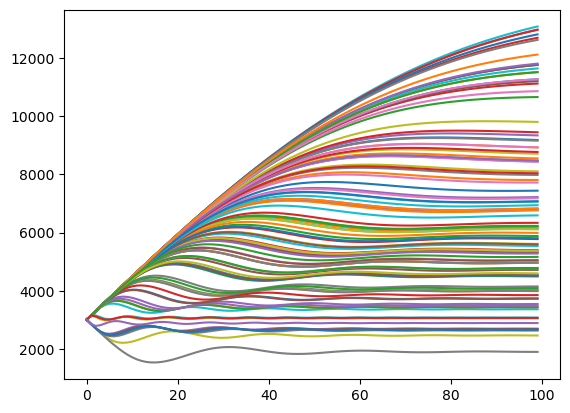

NPSF =  105


100%|██████████| 220/220 [24:46<00:00,  6.76s/it]


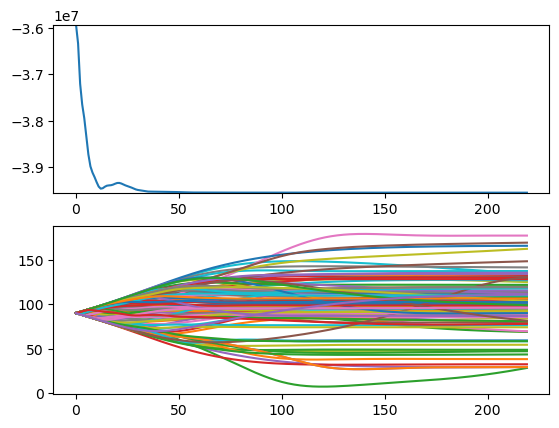

0091
0092
0093
0094
0095
0096
0097
0098
0099
0100
0101
0102
0103
0104
0105


100%|██████████| 100/100 [00:43<00:00,  2.28it/s]


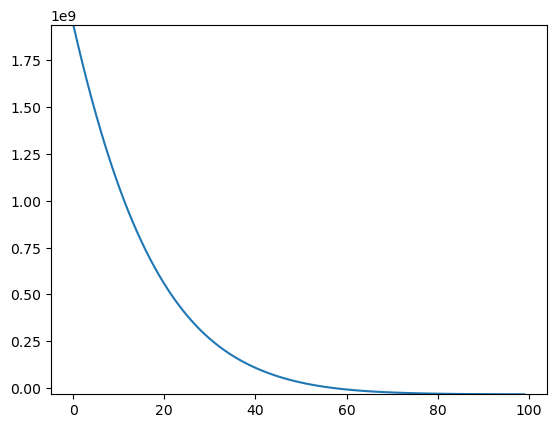

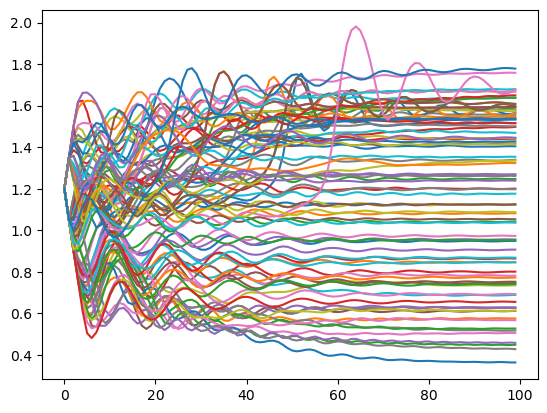

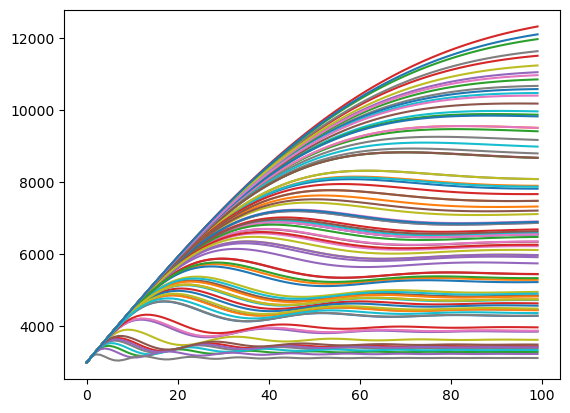

NPSF =  91


100%|██████████| 220/220 [03:03<00:00,  1.20it/s]


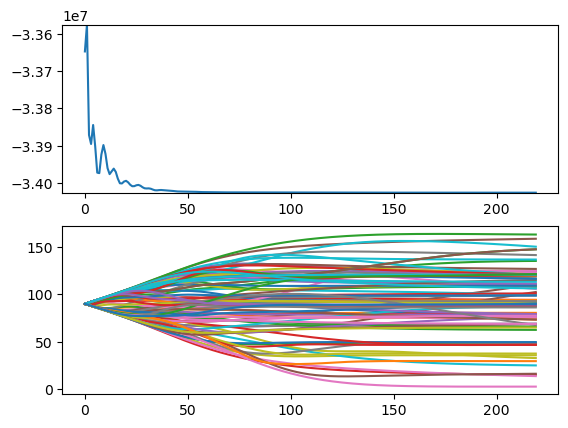

0106
0107
0108
0109
0110
0111
0112
0113
0114
0115
0116
0117
0118
0119
0120


100%|██████████| 100/100 [00:52<00:00,  1.92it/s]


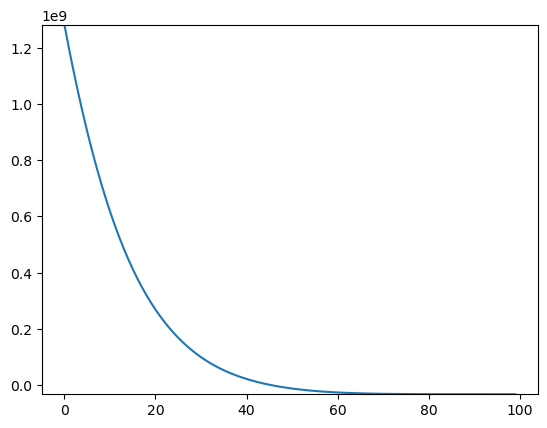

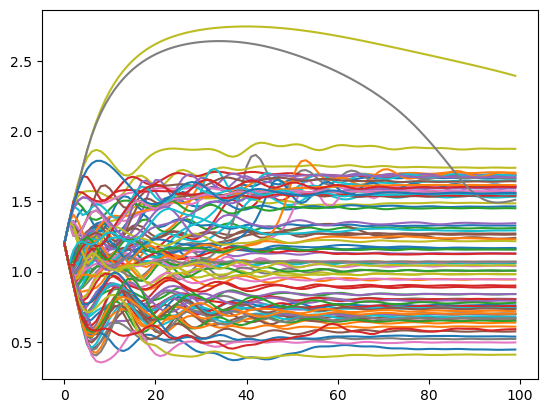

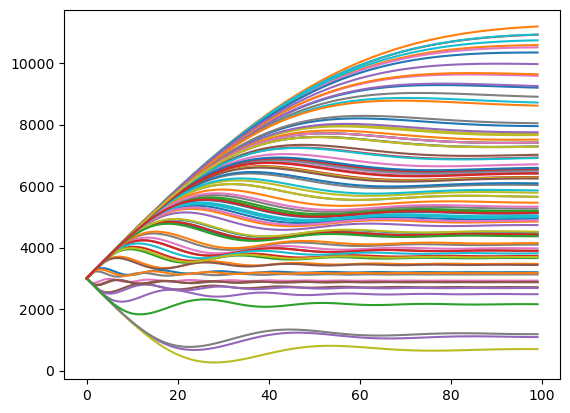

NPSF =  94


100%|██████████| 220/220 [15:25<00:00,  4.21s/it]


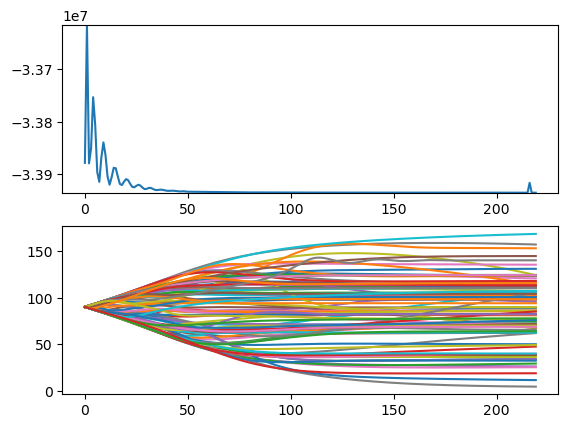

0121
0122
0123
0124
0125
0126
0127
0128
0129
0130
0131
0132
0133
0134
0135


100%|██████████| 220/220 [02:48<00:00,  1.31it/s]


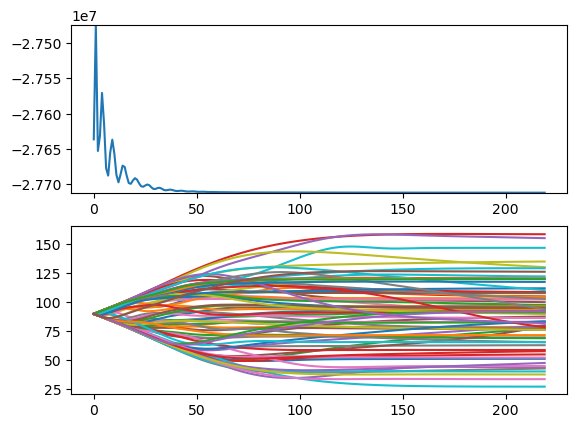

0136
0137
0138
0139
0140
0141
0142
0143
0144
0145
0146
0147
0148
0149
0150


100%|██████████| 100/100 [00:39<00:00,  2.51it/s]


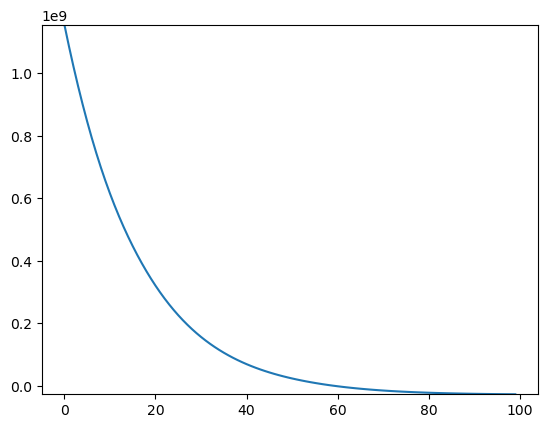

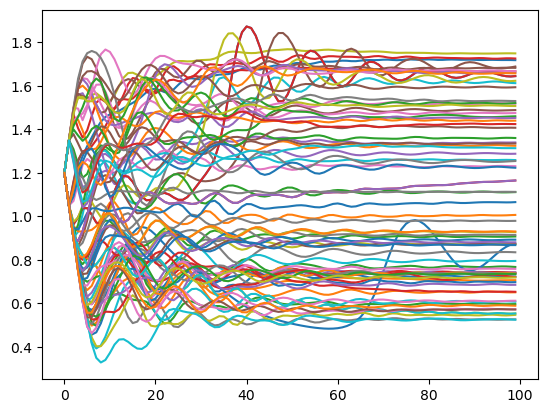

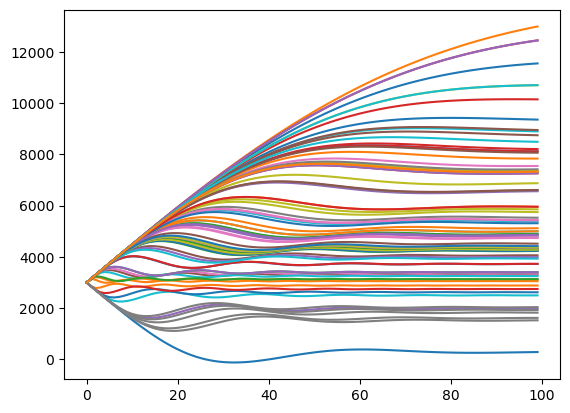

NPSF =  82


100%|██████████| 220/220 [02:54<00:00,  1.26it/s]


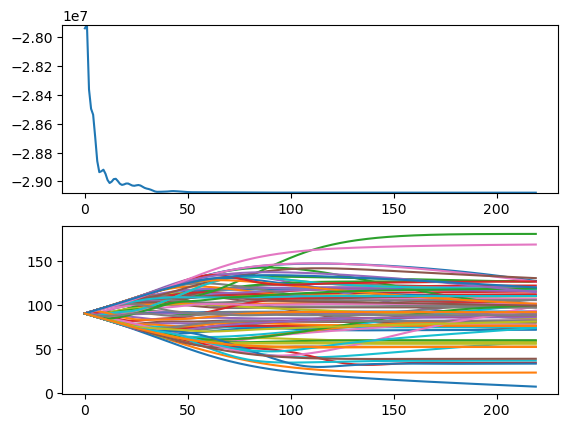

0151
0152
0153
0154
0155
0156
0157
0158
0159
0160
0161
0162
0163
0164
0165


100%|██████████| 100/100 [00:39<00:00,  2.54it/s]


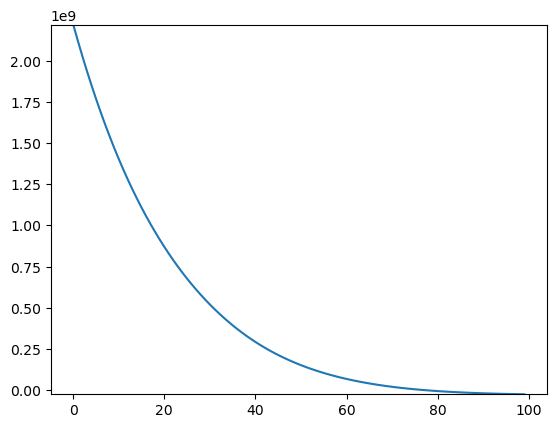

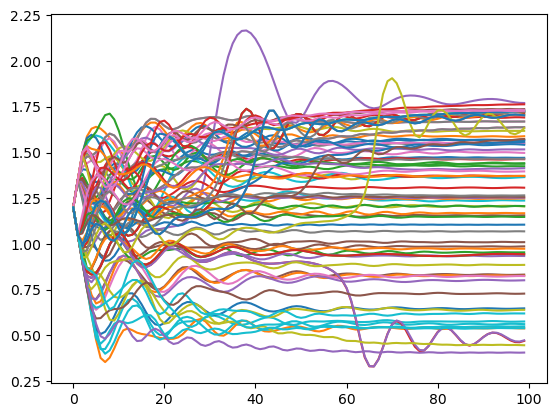

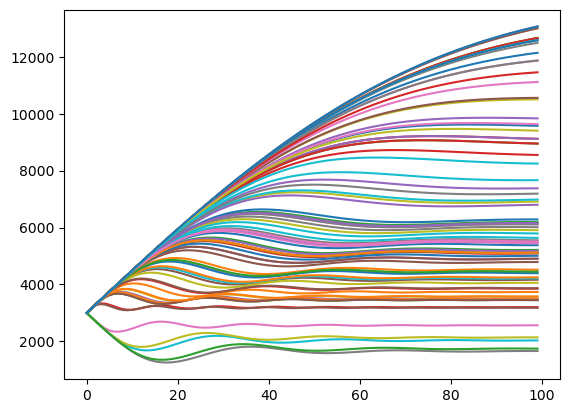

NPSF =  81


100%|██████████| 220/220 [02:53<00:00,  1.27it/s]


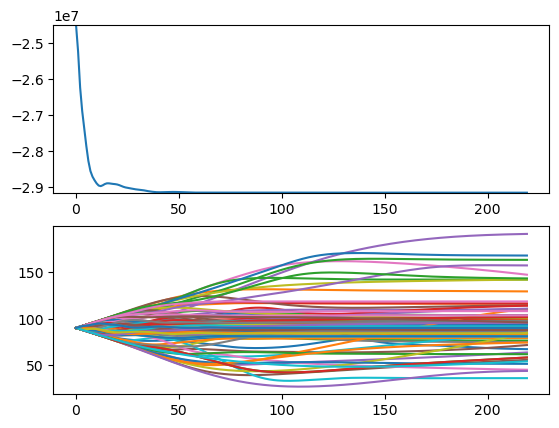

0166
0167
0168
0169
0170
0171
0172
0173
0174
0175
0176
0177
0178
0179
0180


100%|██████████| 100/100 [00:38<00:00,  2.57it/s]


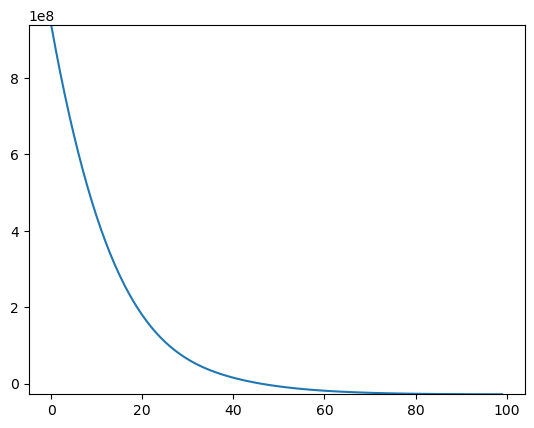

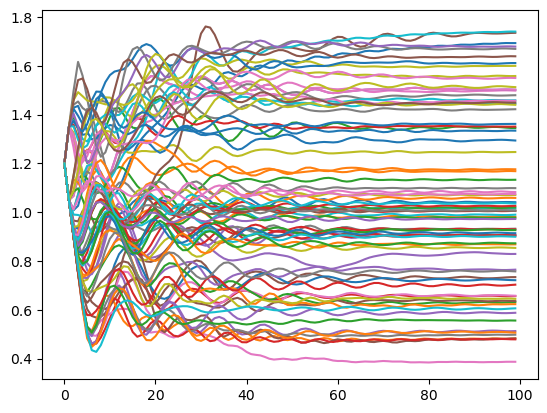

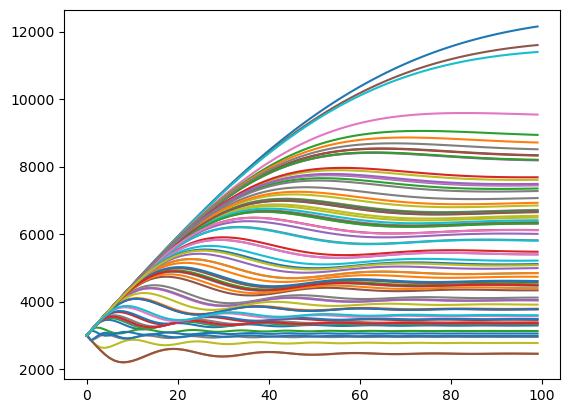

NPSF =  80


100%|██████████| 220/220 [02:52<00:00,  1.27it/s]


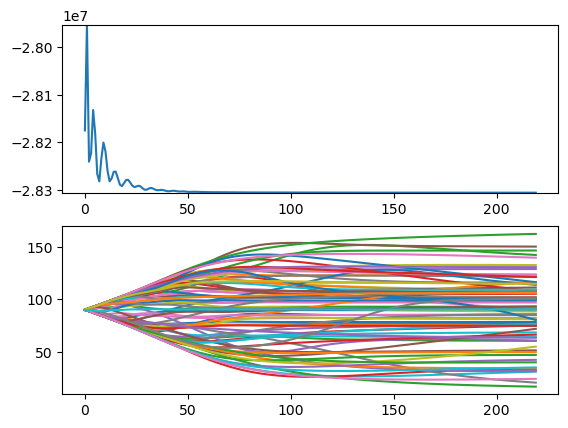

0181
0182
0183
0184
0185
0186
0187
0188
0189
0190
0191
0192
0193
0194
0195


100%|██████████| 100/100 [00:40<00:00,  2.47it/s]


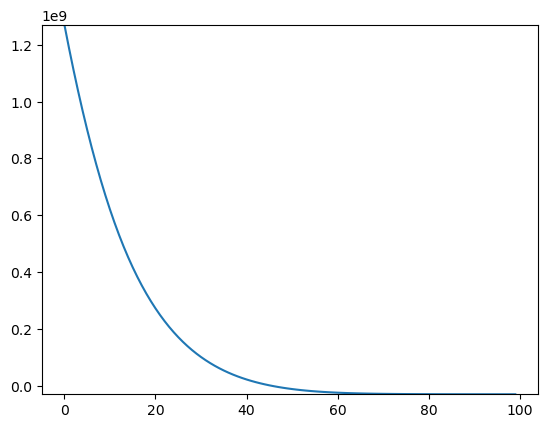

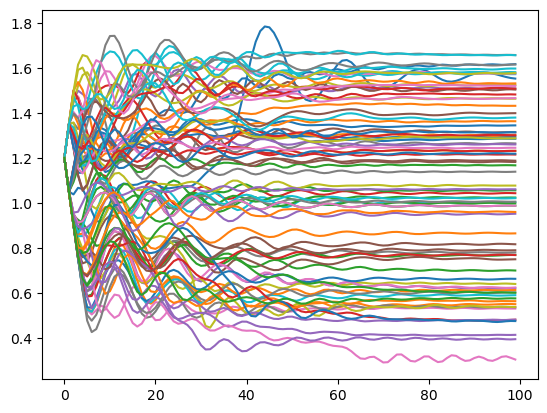

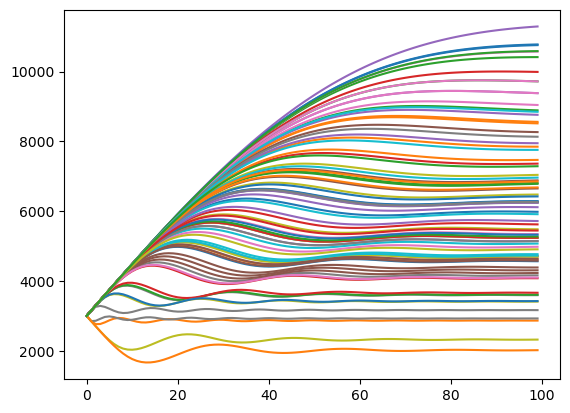

NPSF =  83


100%|██████████| 220/220 [03:27<00:00,  1.06it/s]


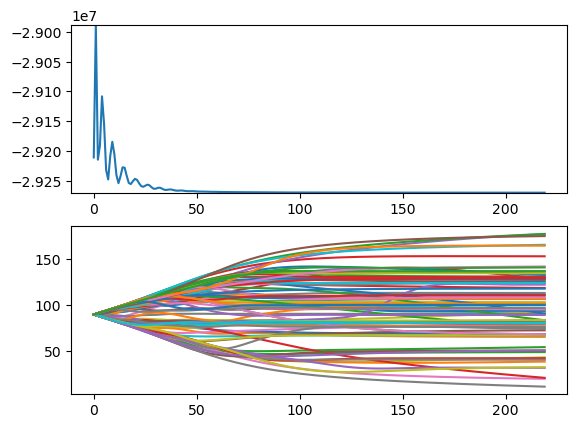

0196
0197
0198
0199
0200
0201
0202
0203
0204
0205
0206
0207
0208
0209
0210


100%|██████████| 100/100 [00:55<00:00,  1.82it/s]


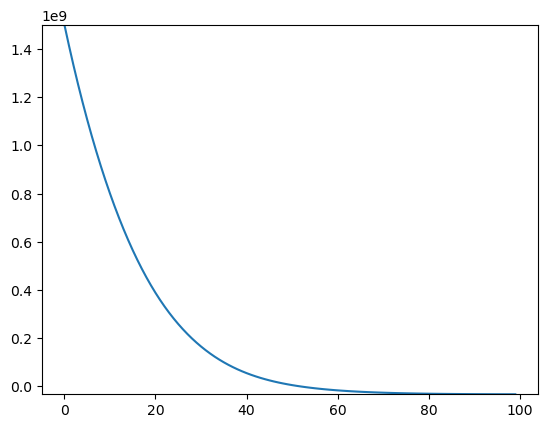

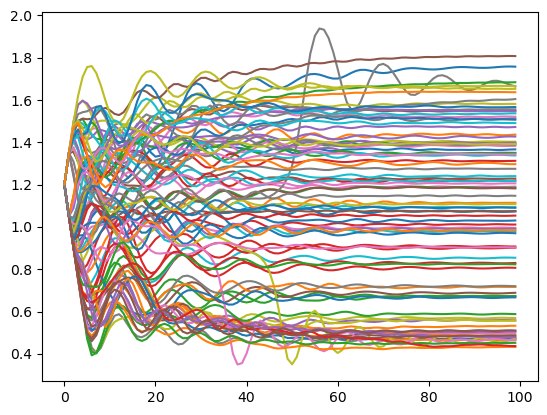

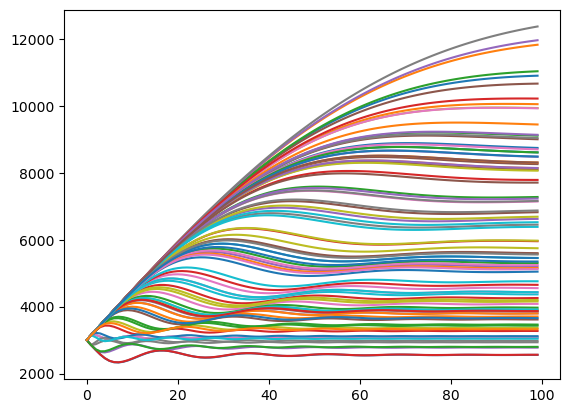

NPSF =  92


100%|██████████| 220/220 [17:26<00:00,  4.76s/it]


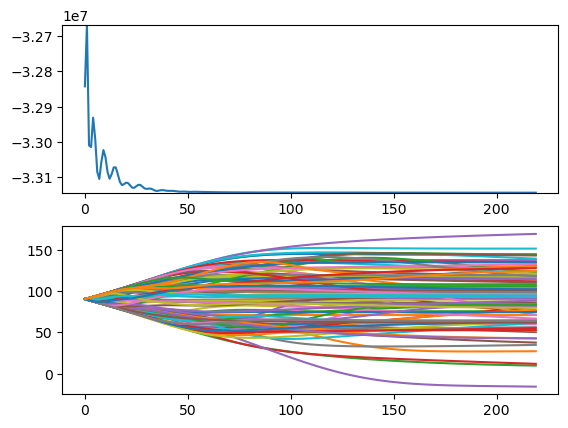

0211
0212
0213
0214
0215
0216
0217
0218
0219
0220
0221
0222
0223
0224
0225


100%|██████████| 100/100 [00:35<00:00,  2.85it/s]


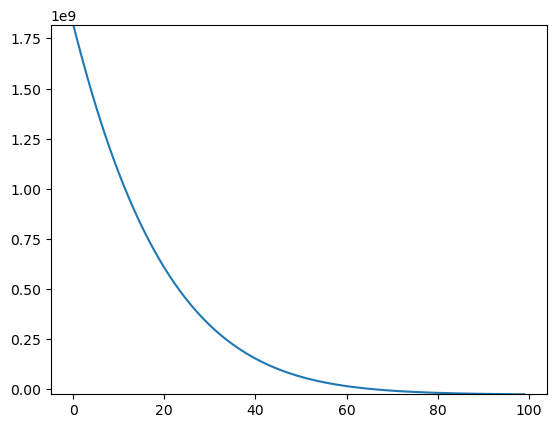

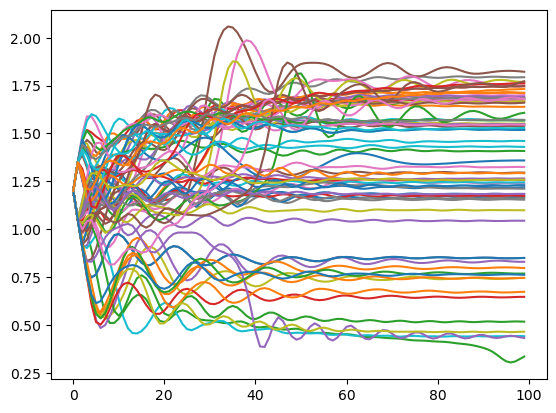

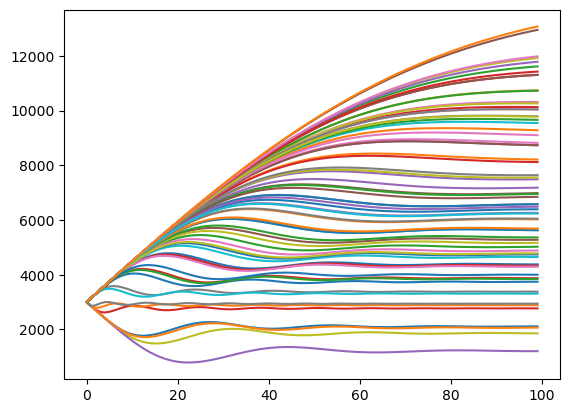

NPSF =  72


100%|██████████| 220/220 [02:43<00:00,  1.35it/s]


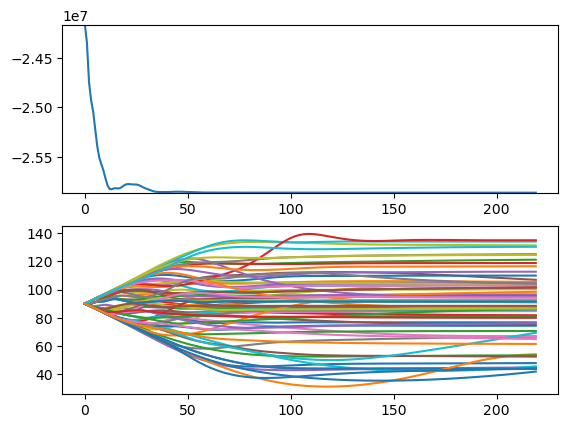

0226
0227
0228
0229
0230
0231
0232
0233
0234
0235
0236
0237
0238
0239
0240


100%|██████████| 100/100 [00:39<00:00,  2.54it/s]


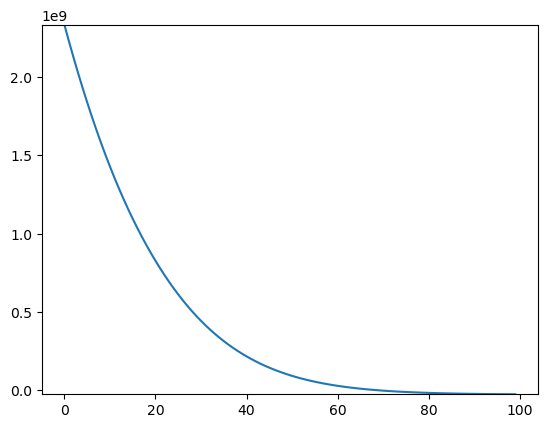

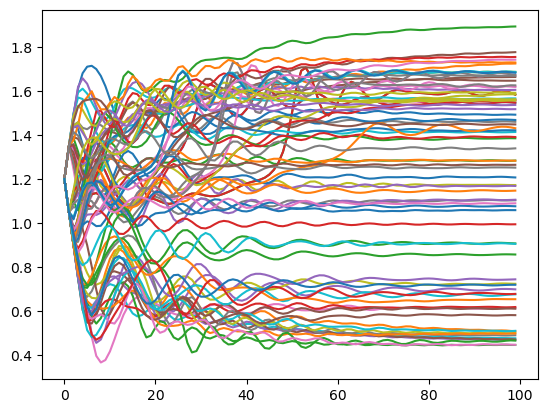

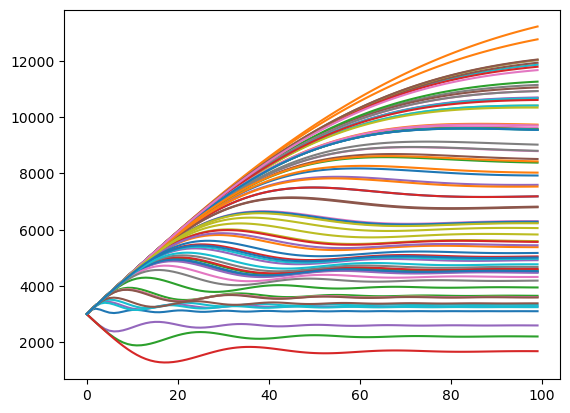

NPSF =  81


100%|██████████| 220/220 [03:24<00:00,  1.07it/s]


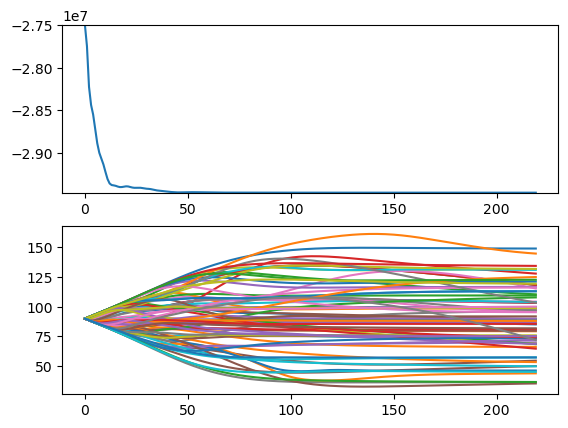

0241
0242
0243
0244
0245
0246
0247
0248
0249
0250
0251
0252
0253
0254
0255


100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


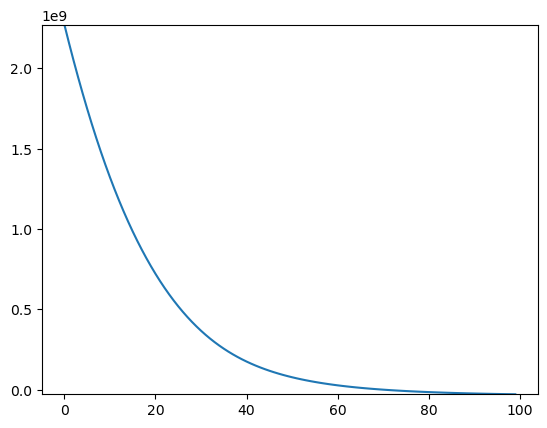

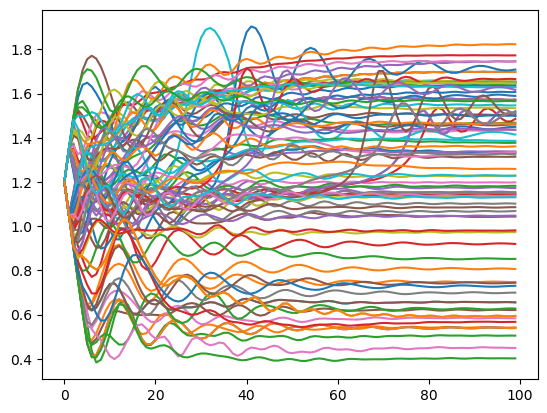

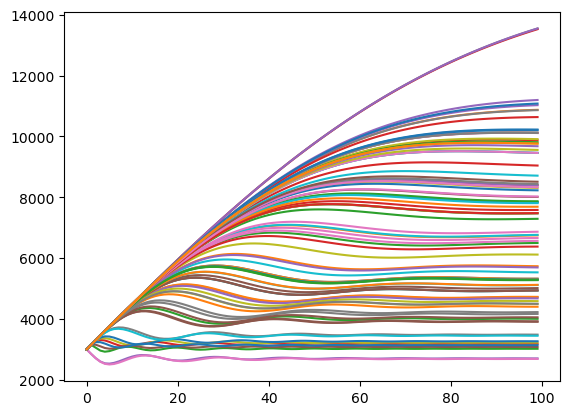

NPSF =  92


100%|██████████| 220/220 [18:32<00:00,  5.06s/it]


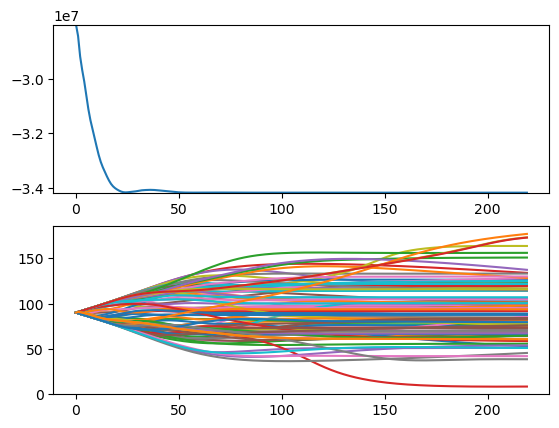

0256
0257
0258
0259
0260
0261
0262
0263
0264
0265
0266
0267
0268
0269
0270


100%|██████████| 100/100 [00:27<00:00,  3.61it/s]


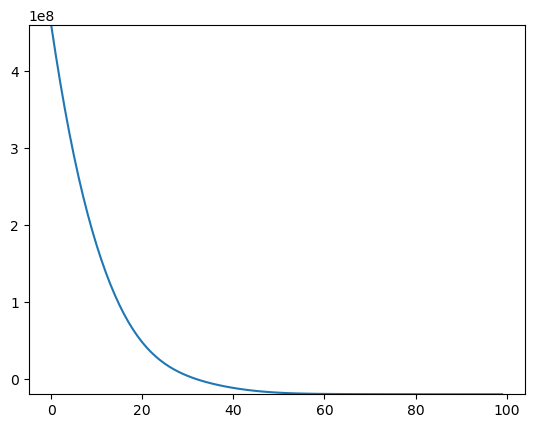

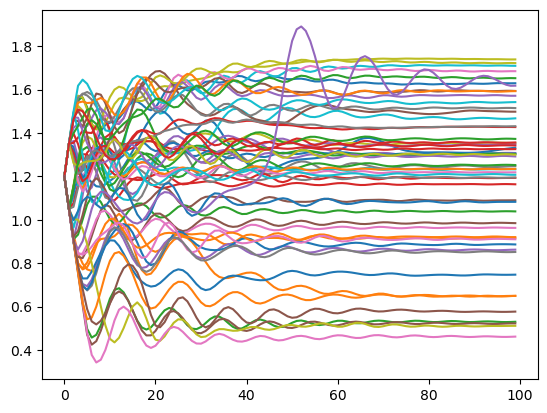

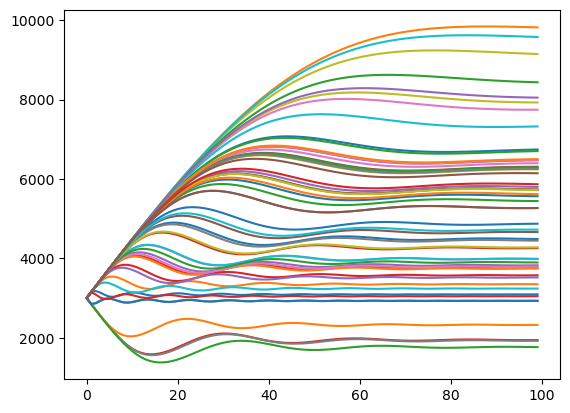

NPSF =  56


 15%|█▌        | 34/220 [00:22<01:52,  1.65it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Error reading \\NAS_LOCCO\Amaury\DATA\PolMFM_SilicaBeads_SLB_NR\2024-01-11_SilicaBeads_Lipids_NR\001_SM_560nm_EM250_25ms\SilicaBead\images\RAW_DATA\image_Pos0_2_reco\image_Pos0_2_0556.tif: [Errno 22] Invalid argument
0557
0558
0559
0560
0561
0562
0563
0564
0565
0566
0567
0568
0569
0570


100%|██████████| 100/100 [25:26<00:00, 15.27s/it]


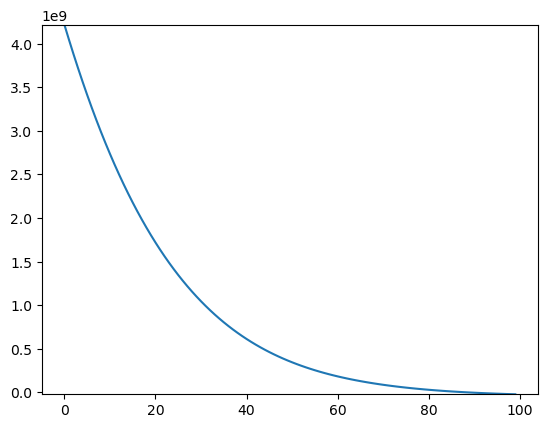

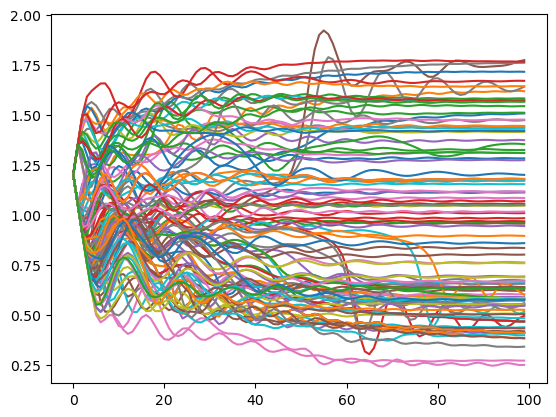

100%|██████████| 220/220 [38:26<00:00, 10.48s/it]


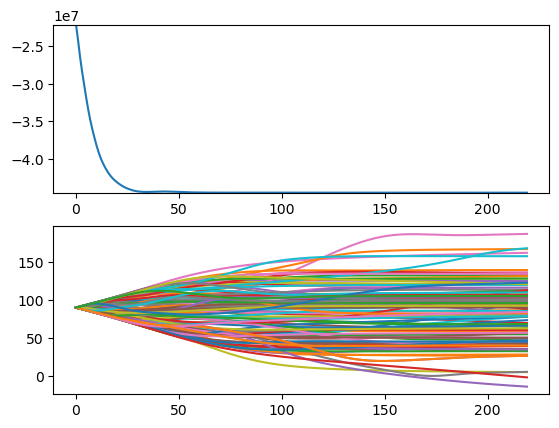

0571
0572
0573
0574
0575
0576
0577
0578
0579
0580
0581
0582
0583
0584
0585


100%|██████████| 100/100 [00:36<00:00,  2.74it/s]


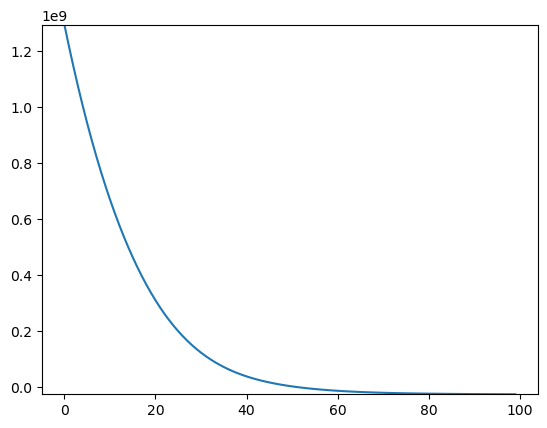

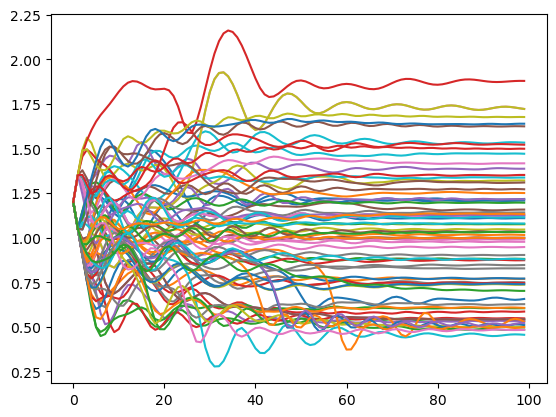

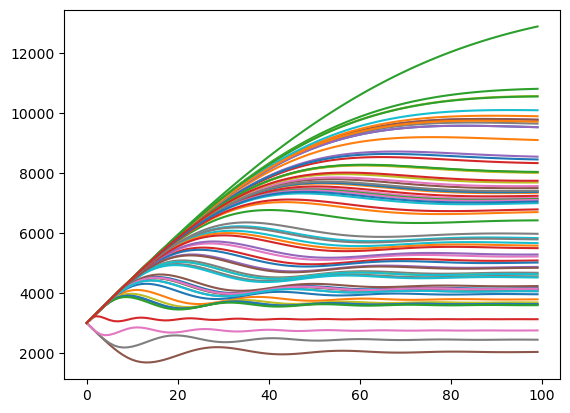

NPSF =  74


100%|██████████| 220/220 [02:46<00:00,  1.32it/s]


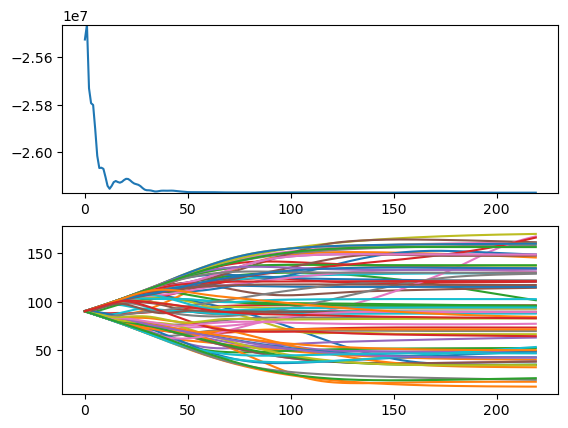

0586
0587
0588
0589
0590
0591
0592
0593
0594
0595
0596
0597
0598
0599
0600


100%|██████████| 100/100 [01:10<00:00,  1.41it/s]


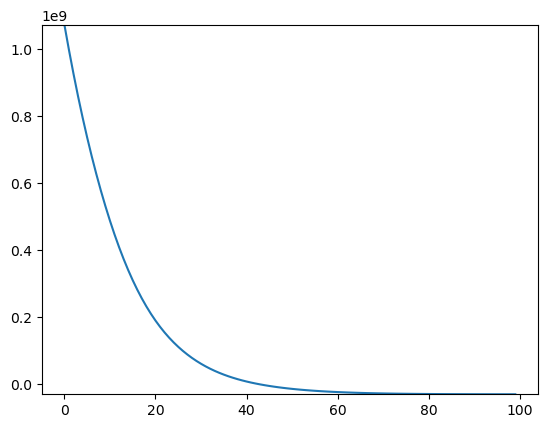

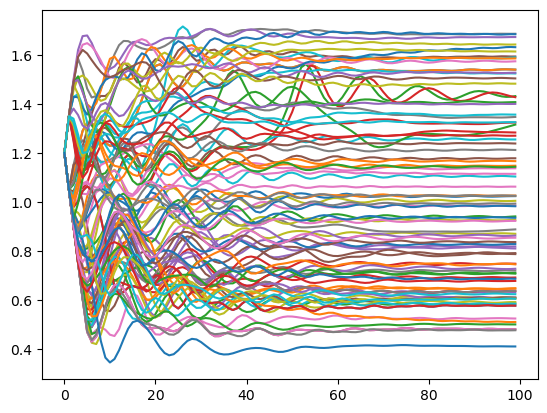

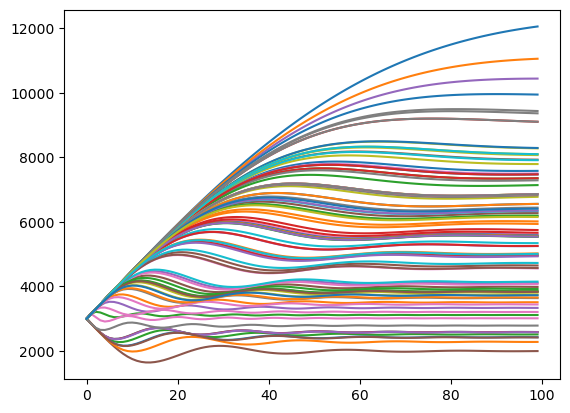

NPSF =  91


100%|██████████| 220/220 [04:50<00:00,  1.32s/it]


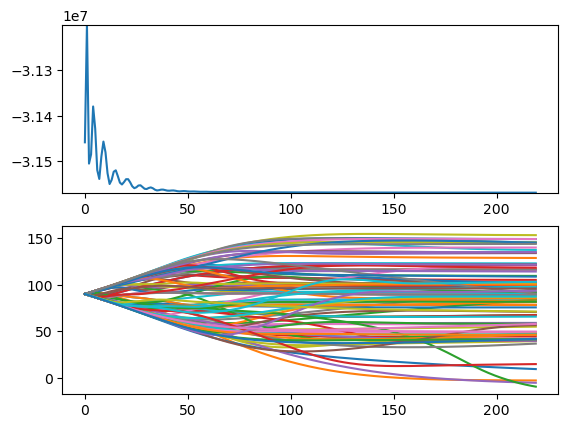

0601
0602
0603
0604
0605
0606
0607
0608
0609
0610
0611
0612
0613
0614
0615


100%|██████████| 100/100 [00:25<00:00,  3.85it/s]


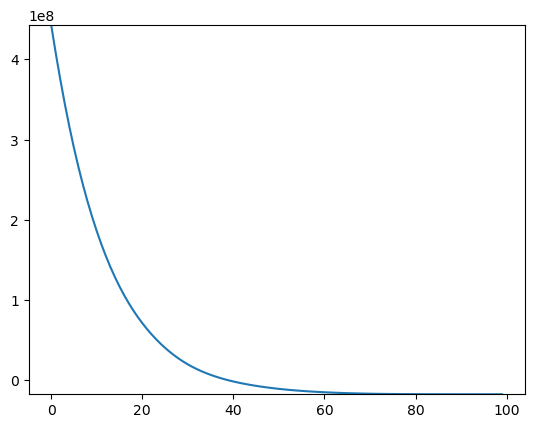

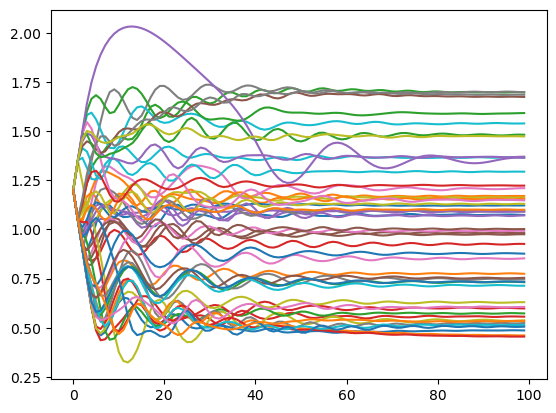

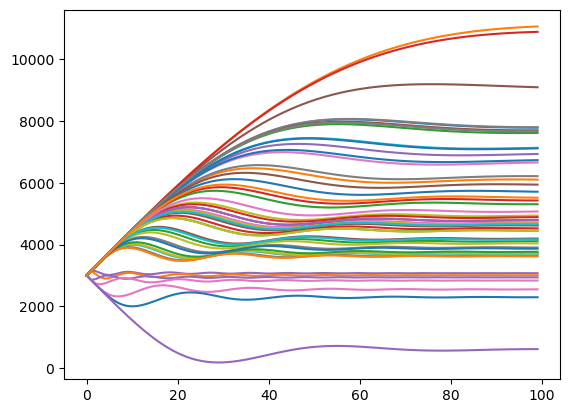

NPSF =  52


100%|██████████| 220/220 [02:23<00:00,  1.53it/s]


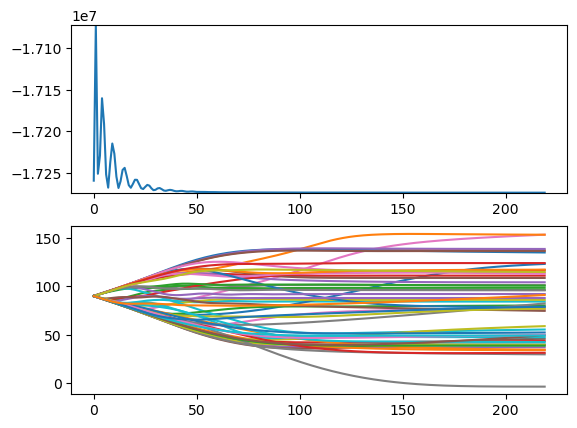

0616
0617
0618
0619
0620
0621
0622
0623
0624
0625
0626
0627
0628
0629
0630


100%|██████████| 100/100 [00:42<00:00,  2.35it/s]


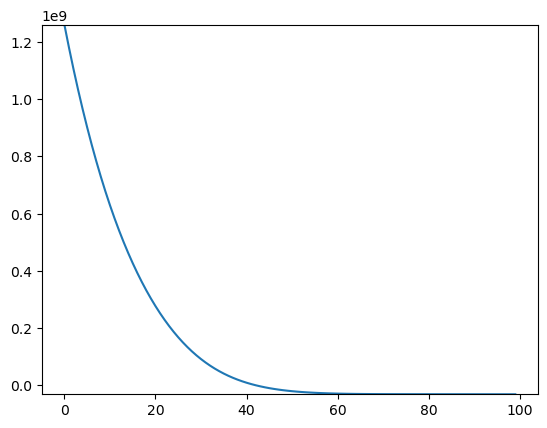

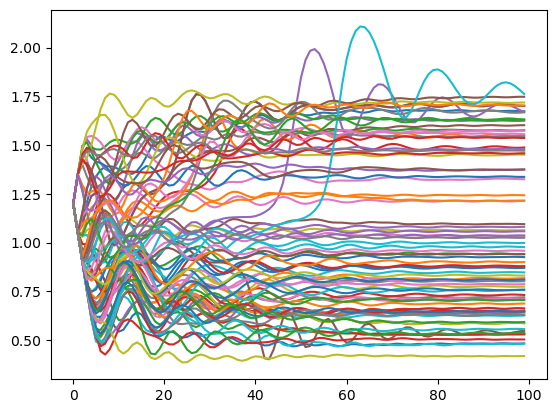

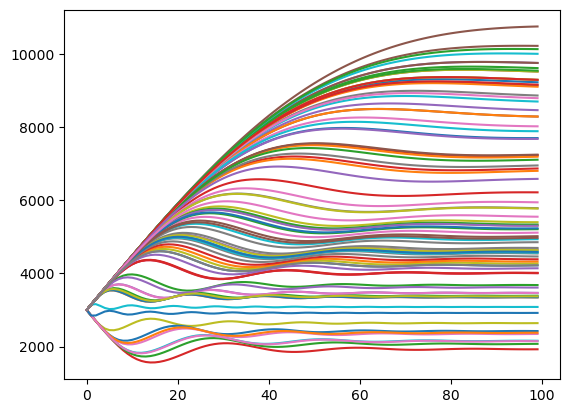

NPSF =  88


100%|██████████| 220/220 [04:10<00:00,  1.14s/it]


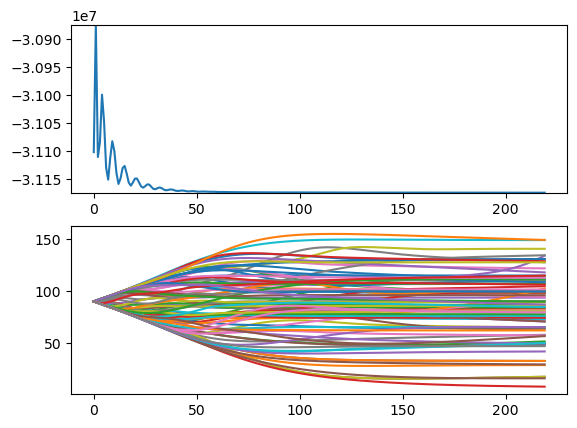

0631
0632
0633
0634
0635
0636
0637
0638
0639
0640
0641
0642
0643
0644
0645


100%|██████████| 100/100 [00:26<00:00,  3.84it/s]


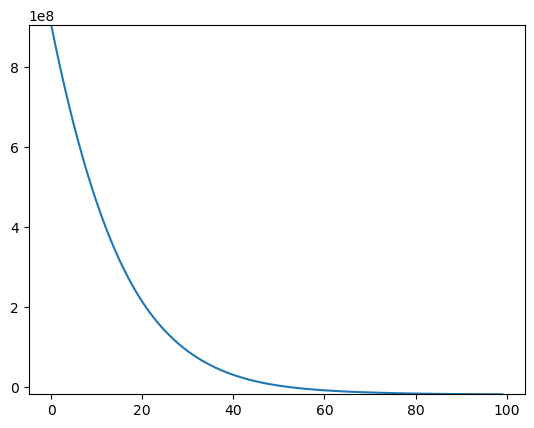

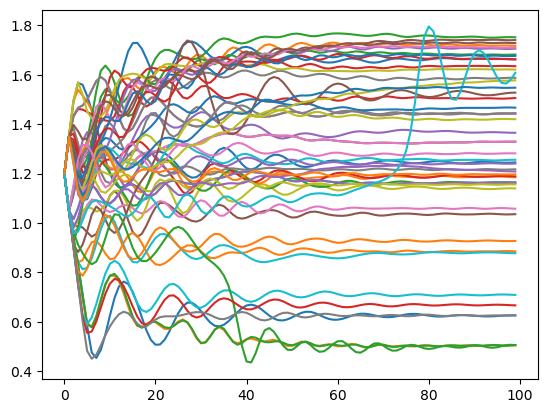

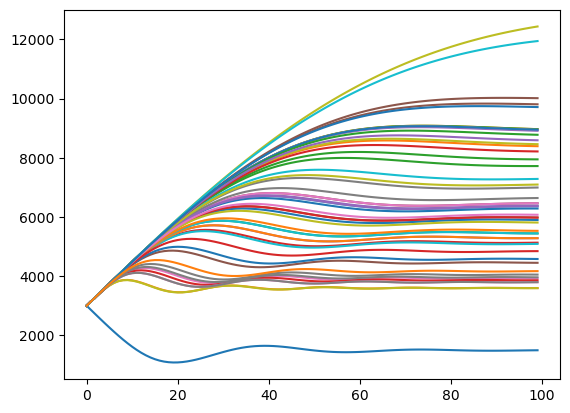

NPSF =  52


100%|██████████| 220/220 [02:23<00:00,  1.53it/s]


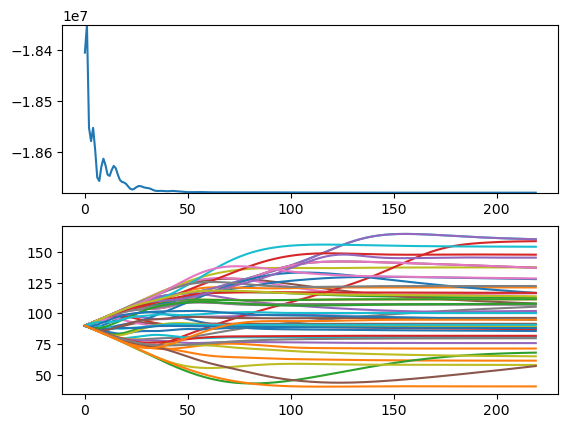

0646
0647
0648
0649
0650
0651
0652
0653
0654
0655
0656
0657
0658
0659
0660


100%|██████████| 100/100 [00:53<00:00,  1.88it/s]


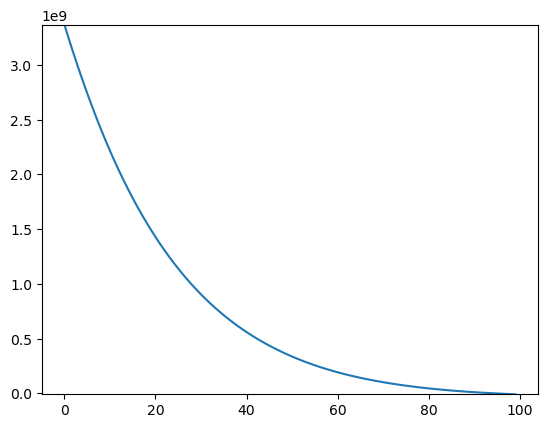

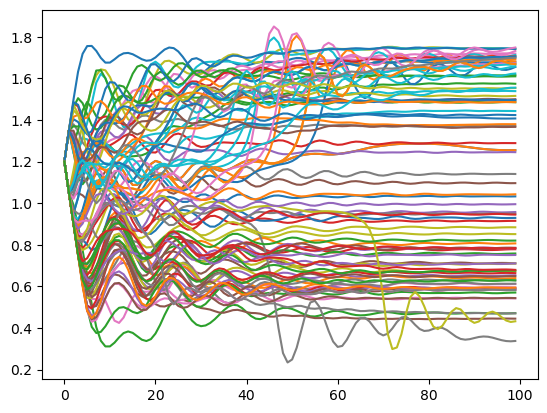

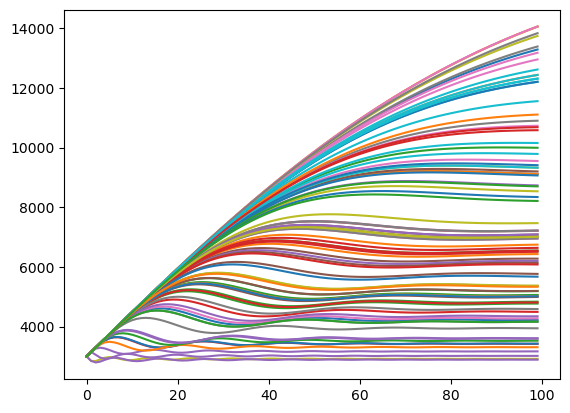

NPSF =  93


100%|██████████| 220/220 [15:32<00:00,  4.24s/it]


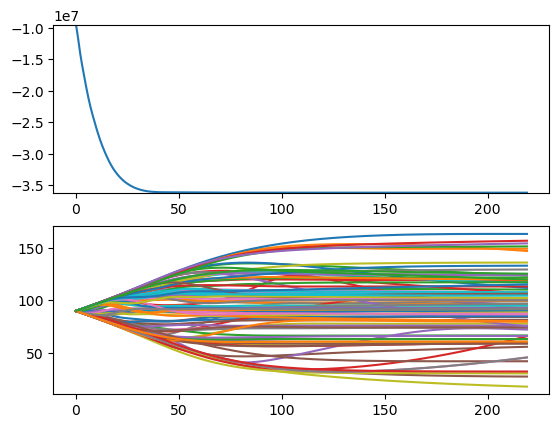

0661
0662
0663
0664
0665
0666
0667
0668
0669
0670
0671
0672
0673
0674
0675


100%|██████████| 100/100 [00:37<00:00,  2.65it/s]


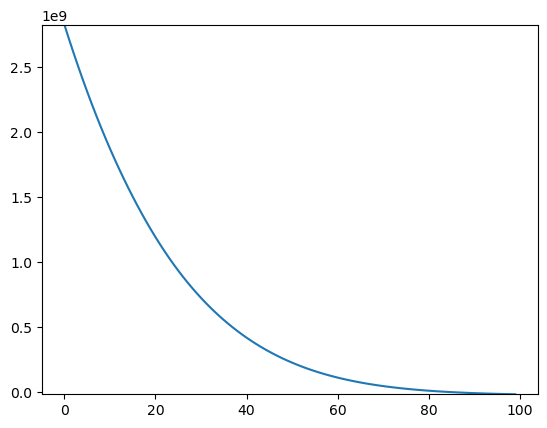

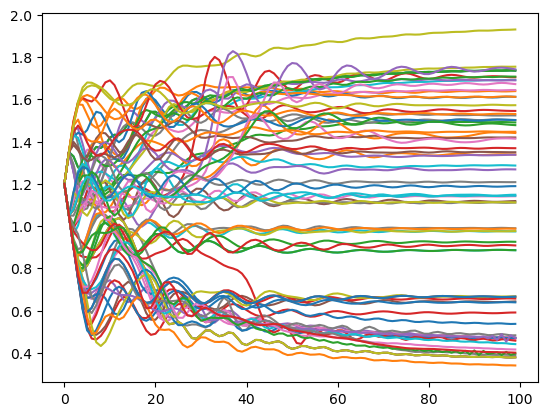

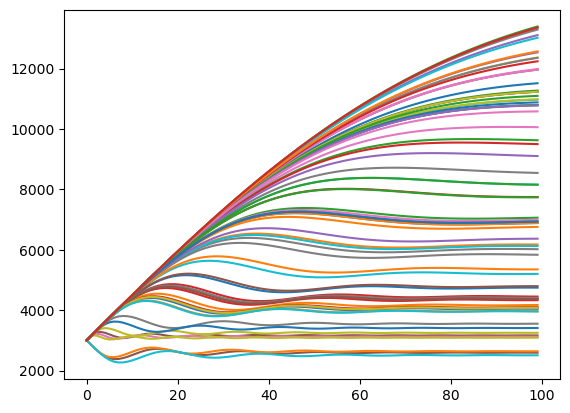

NPSF =  74


100%|██████████| 220/220 [02:45<00:00,  1.33it/s]


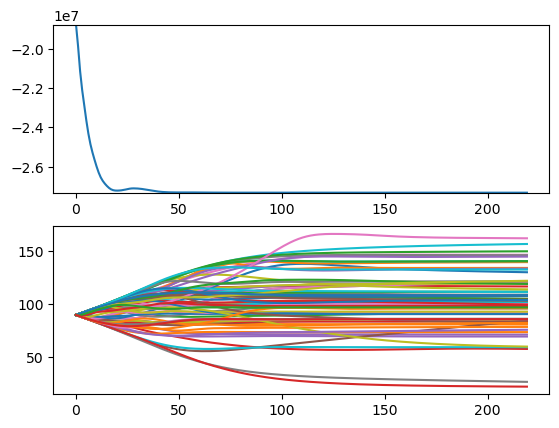

0676
0677
0678
0679
0680
0681
0682
0683
0684
0685
0686
0687
0688
0689
0690


100%|██████████| 100/100 [00:41<00:00,  2.40it/s]


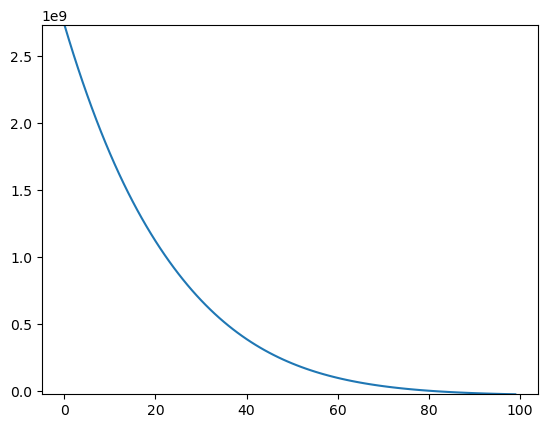

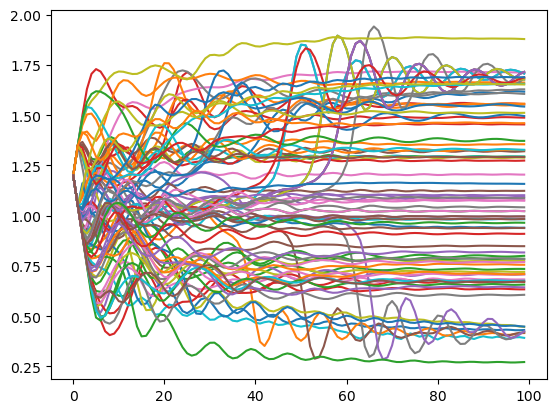

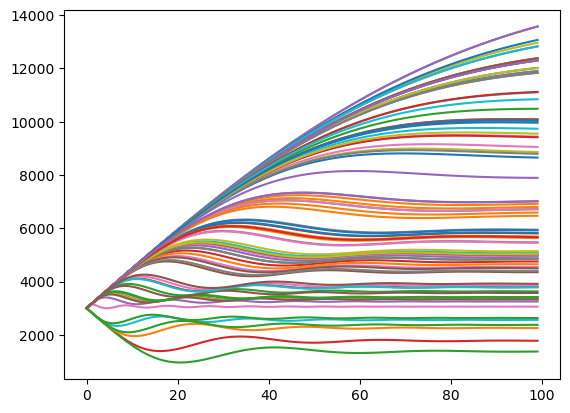

NPSF =  86


100%|██████████| 220/220 [04:30<00:00,  1.23s/it]


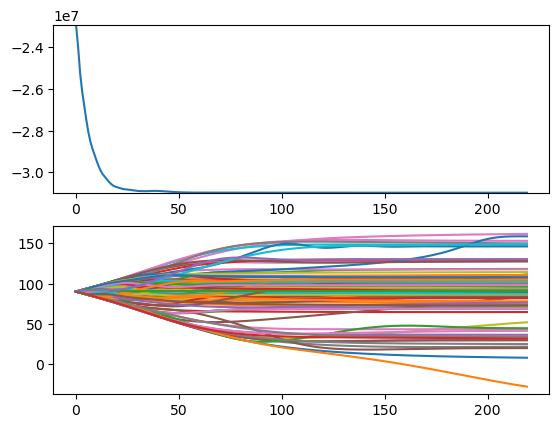

0691
0692
0693
0694
0695
0696
0697
0698
0699
0700
0701
0702
0703
0704
0705


100%|██████████| 100/100 [00:40<00:00,  2.48it/s]


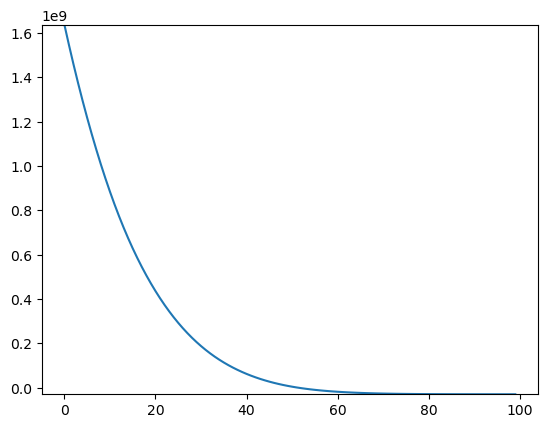

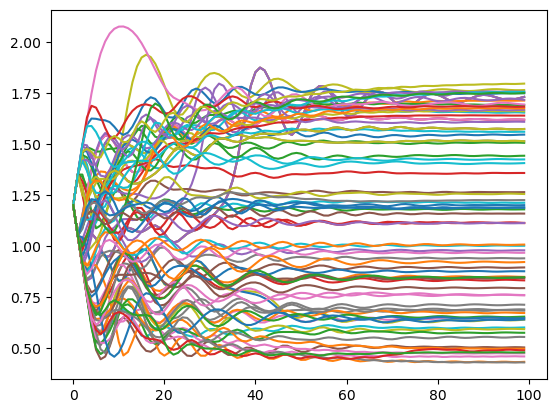

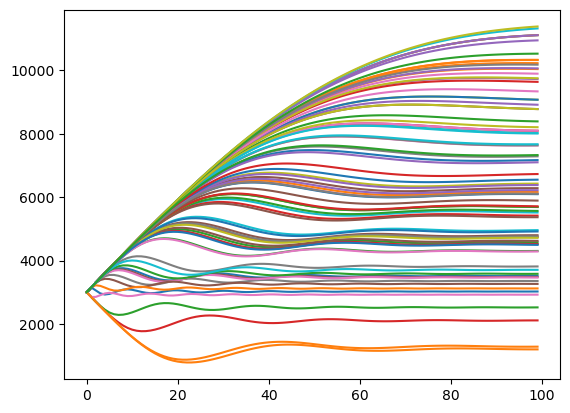

NPSF =  83


  3%|▎         | 7/220 [00:05<02:45,  1.29it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

100%|██████████| 100/100 [01:15<00:00,  1.32it/s]


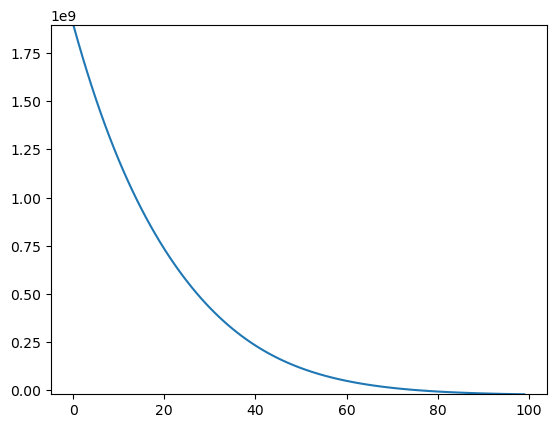

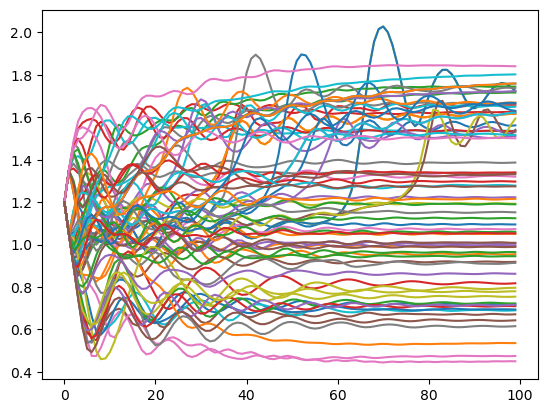

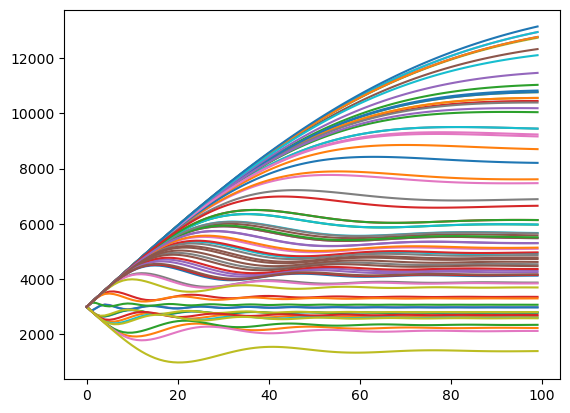

NPSF =  76


100%|██████████| 220/220 [07:04<00:00,  1.93s/it]


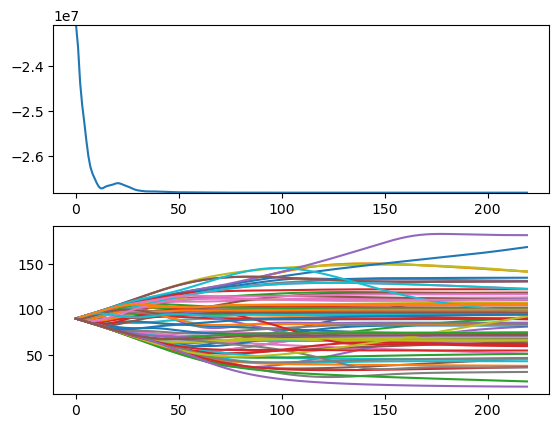

1201
1202
1203
1204
1205
1206
1207
1208
1209
1210
1211
1212
1213
1214
1215


100%|██████████| 100/100 [05:36<00:00,  3.37s/it]


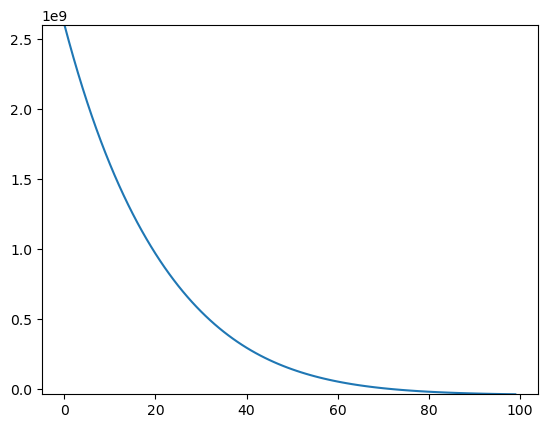

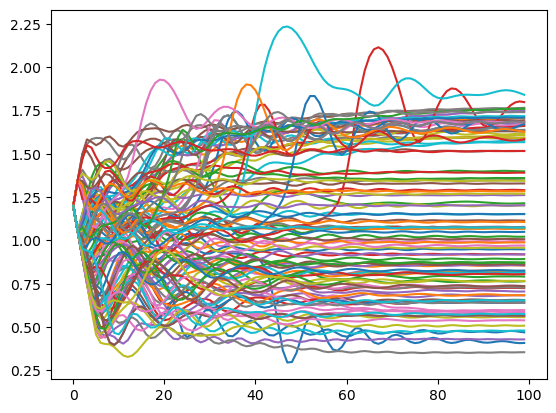

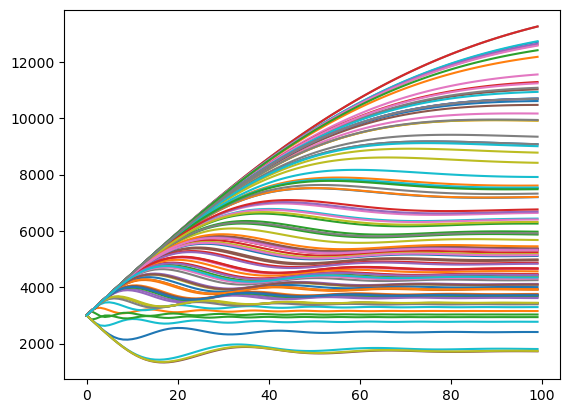

NPSF =  110


100%|██████████| 220/220 [11:56<00:00,  3.26s/it]


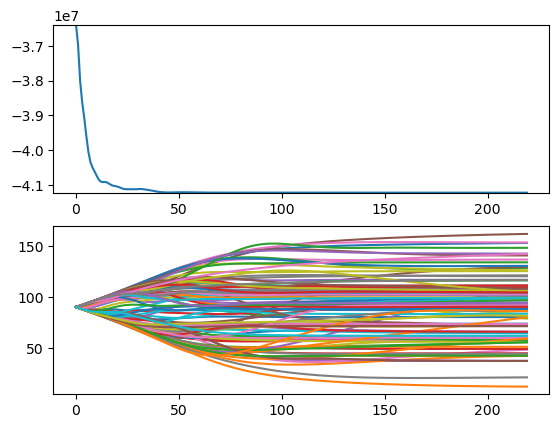

1216
1217
1218
1219
1220
1221
1222
1223
1224
1225
1226
1227
1228
1229
1230


100%|██████████| 100/100 [04:19<00:00,  2.59s/it]


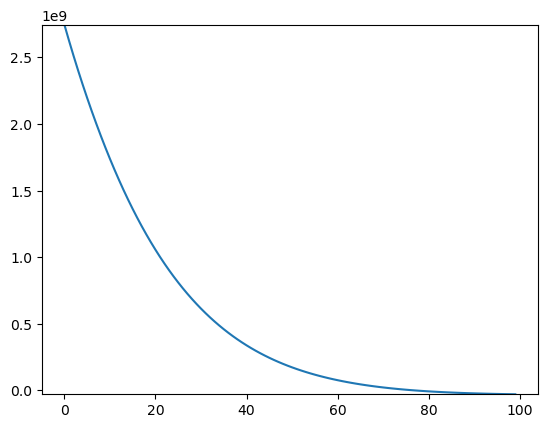

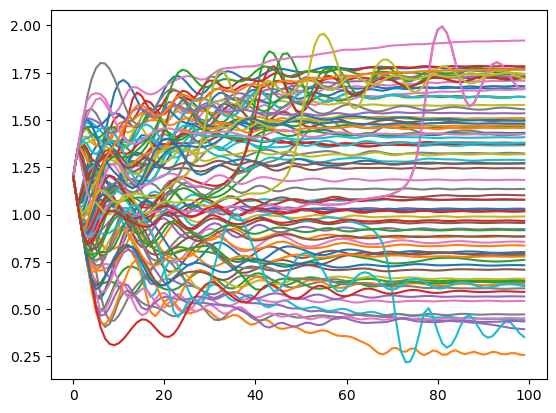

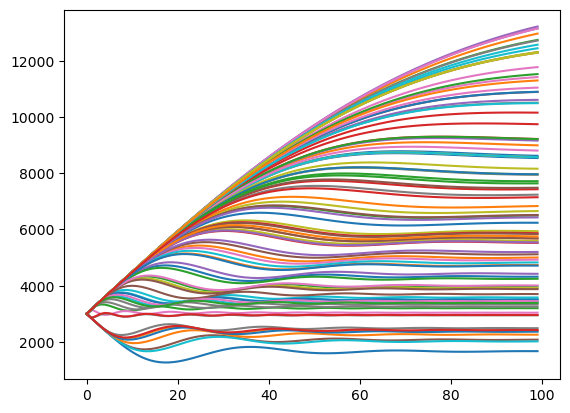

NPSF =  94


100%|██████████| 220/220 [14:26<00:00,  3.94s/it]


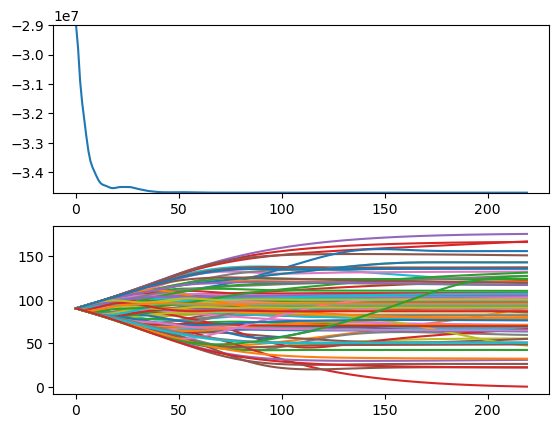

1231
1232
1233
1234
1235
1236
1237
1238
1239
1240
1241
1242
1243
1244
1245


100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


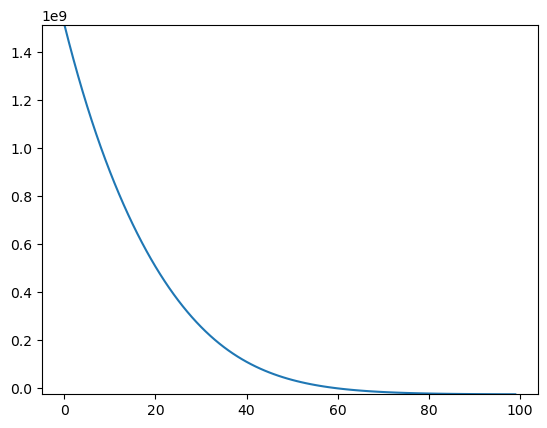

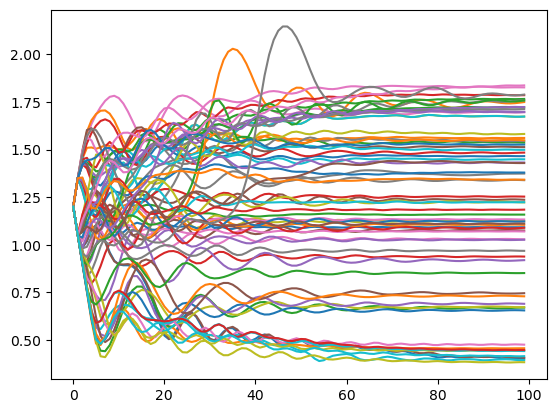

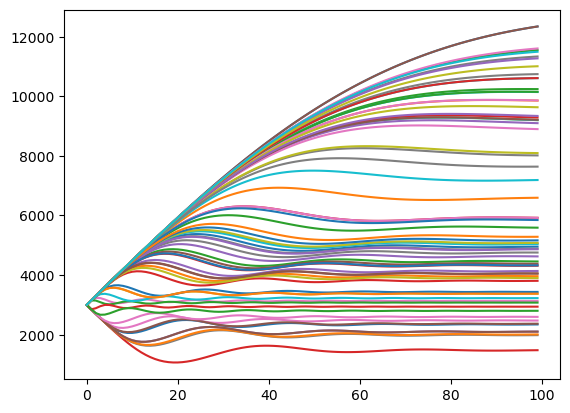

NPSF =  70


  5%|▌         | 12/220 [00:34<10:47,  3.11s/it]

In [ ]:
for batch_number in range(N_batch):
    t0 = time.time()
    raw, error_indices = extract_frames((batch_number+batch_offset)*Nframe+1, Nframe)
    x, y, z, rho, delta, index_frame = extract_positions((batch_number+batch_offset)*Nframe+1, Nframe, error_indices)
    raw = raw*sensitivity/(QE*EM)

    sigma = np.std(raw.flatten())
    background = np.mean(raw.flatten())

    nb = len(x)
    for k, ele in enumerate(x):
        if np.isnan(x[nb-1-k]) or np.isnan(y[nb-1-k]) or np.isnan(z[nb-1-k]) or np.isnan(rho[nb-1-k]) or np.isnan(delta[nb-1-k]):
            x = np.delete(x,nb-1-k,0)
            y = np.delete(y,nb-1-k,0)
            z = np.delete(z,nb-1-k,0)
            rho = np.delete(rho,nb-1-k,0)
            delta = np.delete(delta,nb-1-k,0)
            index_frame = np.delete(index_frame,nb-1-k,0)
    
    NPSF = len(x)

    single_psf = extract_raw_xy(raw[0], x[index_frame==0], y[index_frame==0])
    for i in range(1,Nframe):
        single_psf = np.concatenate((single_psf, extract_raw_xy(raw[i], x[index_frame==i], y[index_frame==i])))

    single_psf = single_psf[:,::-1]

    x_start = torch.tensor([0. for k in range(len(x))], requires_grad=False, device=device)
    y_start = torch.tensor([0. for k in range(len(x))], requires_grad=False, device=device)

    z_exp =  torch.tensor([1.2 for k in range(len(x))], requires_grad=False, device=device) 

    rho_exp = torch.tensor(rho, requires_grad=False, device=device)
    delta_exp = torch.tensor(delta, requires_grad=False, device=device)

    d_ = -torch.tensor([d[1] for k in range(len(x))], requires_grad=False, device=device)
    second_plane = torch.tensor([d[1]-d[0], 0, d[1]-d[2]], device=device)
    polar_projections = np.array([0, 45, 0])

    N=torch.tensor(80, device=device)
    l_pixel=torch.tensor(16, device=device)
    NA=torch.tensor(1.4, device=device)
    mag=torch.tensor(100, device=device)
    lambd=torch.tensor(638, device=device)
    f_tube=torch.tensor(200, device=device)
    MAG=torch.tensor(200/150, device=device)
    xx, yy, th1, phi, [Ex0, Ex1, Ex2], [Ey0, Ey1, Ey2], r, r_cut, k_, f_o = vectorial_BFP_perfect_focus(N, NA=NA, mag=mag, lambd=lambd, f_tube=f_tube, device=device)

    if batch_number==0:
        phase_mask = torch.stack([torch.ones((N,N), device=device), torch.ones((N,N), device=device), torch.ones((N,N), device=device)])
        zernike_base = generate_zernike_base(r_cut=r_cut, N=N, zernike_order=4, device=device)
        zernike_coefs_x = torch.zeros((3,15), device=device)
        zernike_coefs_y = torch.zeros((3,15), device=device)
    
    noisy_psf = torch.tensor([single_psf[k] for k in range(len(x))], device=device)

    u, v, M = compute_M(xp=x_start, yp=y_start, zp=z_exp, d=d_, x=xx, y=yy, th1=th1, phi=phi, Ex0=Ex0, Ex1=Ex1, Ex2=Ex2
                    , Ey0=Ey0, Ey1=Ey1, Ey2=Ey2, r=r, r_cut=r_cut, k=k_, f_o=f_o, phase_maskx=phase_mask, phase_masky=phase_mask, zernike_base=zernike_base, zernike_coefs_x=zernike_coefs_x, zernike_coefs_y=zernike_coefs_x,
                        second_plane=second_plane, polar_projections=polar_projections, N=N, l_pixel=l_pixel
                    , NA=NA, mag=mag, lambd=lambd, f_tube=f_tube, MAG=MAG, device=device, polar_offset=0., polar_offset2=0.)
    h = PSF(rho=torch.tensor(np.array([45. for k in range(NPSF)]), device=device), eta=torch.tensor([45. for k in range(NPSF)], device=device), delta=torch.tensor([100. for k in range(NPSF)], device=device), M=M, N_photons=torch.tensor([1000. for k in range(NPSF)], device=device))
    
    dim_simu = int(h.shape[-1]//2)

    ### first SGD on pos
    Nstart = torch.tensor([3000 for i in range(NPSF)], requires_grad=False, device=device)
    eta_rd = torch.tensor([45. for k in range(NPSF)], requires_grad=False, device=device)
    delta_rd = torch.tensor([150. for k in range(NPSF)], requires_grad=False, device=device)

    params = torch.cat((x_start, y_start, z_exp, Nstart/1000))
    params.requires_grad=True

    optimizer = torch.optim.Adam([params], lr=0.15)  # Learning rate = 0.012

    num_epochs_max = 100
    loss_ = []
    z__ = []
    N__ = []
    for i in tqdm(range(num_epochs_max)):
        optimizer.zero_grad()  # Reset gradients
        loss = loss_pos(params[0:NPSF], params[NPSF:2*NPSF], params[2*NPSF:3*NPSF], rho_exp
                            , eta_rd, delta_exp, params[3*NPSF:4*NPSF]*1000, noisy_psf, second_plane, background, sigma, dim_simu) 
        loss_.append(loss.cpu().detach().numpy())
        z__.append(params[2*NPSF:3*NPSF].cpu().detach().numpy())
        N__.append((params[3*NPSF:4*NPSF]*1000).cpu().detach().numpy())
        loss.backward()  # Backpropagation
        optimizer.step()  # Update parameters
    ax = plt.plot(loss_)
    plt.ylim((np.min(np.array(loss_)), np.max(np.array(loss_))))
    plt.show()
    ax = plt.plot(z__)
    plt.show()
    ax = plt.plot(N__)
    plt.show()
    del(ax, loss_, z__, N__)

    x_found = params[0:NPSF].detach()
    y_found = params[NPSF:2*NPSF].detach()
    z_found = params[2*NPSF:3*NPSF].detach()
    N_found = params[3*NPSF:4*NPSF].detach()*1000
    del(params, loss)
    print('NPSF = ', NPSF)

    ### SGD 2 on orientation

    u, v, M = compute_M(xp=x_found, yp=y_found, zp=z_found, d=d_, x=xx, y=yy, th1=th1, phi=phi, Ex0=Ex0, Ex1=Ex1, Ex2=Ex2
                    , Ey0=Ey0, Ey1=Ey1, Ey2=Ey2, r=r, r_cut=r_cut, k=k_, f_o=f_o, phase_maskx=phase_mask, phase_masky=phase_mask, zernike_base=zernike_base, zernike_coefs_x=zernike_coefs_x, zernike_coefs_y=zernike_coefs_x,
                        second_plane=second_plane, polar_projections=polar_projections, N=N, l_pixel=l_pixel
                    , NA=NA, mag=mag, lambd=lambd, f_tube=f_tube, MAG=MAG, device=device, polar_offset=27., polar_offset2=27.)
    
    eta_rd = torch.tensor([90. for k in range(NPSF)], requires_grad=False, device=device)
    offset_proj=torch.tensor(27., device=device)
    params = torch.cat((eta_rd, eta_rd, eta_rd, N_found/100, x_found*50, y_found*50, z_found*50))
    params.requires_grad=True

    # Use Stochastic Gradient Descent (SGD) to optimize params
    optimizer = torch.optim.Adam([params], lr=0.7)  # Learning rate = 0.01

    num_epochs_max = 220
    loss_ = []
    eta_ = []
    for i in tqdm(range(num_epochs_max)):
        optimizer.zero_grad()  # Reset gradients
        loss = loss_angle_with_M(offset_proj, offset_proj, params[:NPSF], params[1*NPSF:2*NPSF], params[2*NPSF:3*NPSF], 100*params[3*NPSF:4*NPSF], params[4*NPSF:5*NPSF]/50, params[5*NPSF:6*NPSF]/50, params[6*NPSF:7*NPSF]/50, noisy_psf, background, sigma, dim_simu)
        loss_.append(loss.cpu().detach().numpy())
        eta_.append(params[1*NPSF:2*NPSF].cpu().detach().numpy())
        loss.backward()  # Backpropagation
        optimizer.step()  # Update parameters
    fig, ax = plt.subplots(2)
    ax[0].plot(loss_) 
    ax[0].set_ylim((np.min(np.array(loss_)), np.max(np.array(loss_))))
    ax[1].plot(eta_)
    plt.show()
    del(fig, ax)

    rho_found=params[0:NPSF].detach()%180
    eta_found=params[1*NPSF:2*NPSF].detach()%180
    delta_found=params[2*NPSF:3*NPSF].detach()
    N_found2 = 100*params[3*NPSF:4*NPSF].detach()
    x_found = (params[4*NPSF:5*NPSF]/50).detach()
    y_found = (params[5*NPSF:6*NPSF]/50).detach()
    z_found = (params[6*NPSF:7*NPSF]/50).detach()
    offset_proj_found = offset_proj
    offset_proj_found2 = offset_proj
    del(params, loss, eta_, loss_)
    u, v, M = compute_M(xp=x_found, yp=y_found, zp=z_found, d=d_, x=xx, y=yy, th1=th1, phi=phi, Ex0=Ex0, Ex1=Ex1, Ex2=Ex2
                    , Ey0=Ey0, Ey1=Ey1, Ey2=Ey2, r=r, r_cut=r_cut, k=k_, f_o=f_o, phase_maskx=phase_mask, phase_masky=phase_mask, zernike_base=zernike_base, zernike_coefs_x=zernike_coefs_x, zernike_coefs_y=zernike_coefs_x,
                        second_plane=second_plane, polar_projections=polar_projections, N=N, l_pixel=l_pixel
                    , NA=NA, mag=mag, lambd=lambd, f_tube=f_tube, MAG=MAG, device=device, polar_offset=offset_proj_found, polar_offset2=offset_proj_found2)
    score = score_eval(M.detach().cpu(), rho_found.cpu(), eta_found.cpu(), delta_found.cpu(), N_found2.cpu(), noisy_psf.cpu(), background, sigma, dim_simu)
    x_ = (x/0.120).astype(int)*0.12 + x_found.cpu().detach().numpy()
    y_ = (y/0.120).astype(int)*0.12 + y_found.cpu().detach().numpy()
    np.savez_compressed('D:/AMAURY/experimental_processed/these_4polar_MFM/SLB_angles27_with_fine_xyz/'+str(int(batch_number)+1+batch_offset)+'.npz', frame = index_frame, x=x_, y=y_, z=1000*z_found.cpu().detach().numpy(), N_photons=N_found2.cpu().detach().numpy(), offset_proj=offset_proj_found.cpu().detach().numpy(), offset_proj2=offset_proj_found2.cpu().detach().numpy(), rho=rho_found.cpu().detach().numpy(), eta=eta_found.cpu().detach().numpy(), delta=delta_found.cpu().detach().numpy(), score=score, x_start=x, y_start=y, z_start=z, rho_start=rho, delta_start=delta)
